___

# 수원시 스마트 버스정류장 우선 설치위치 선정 실행코드 (팀 관운장)

___

## 개요
- 본 코드는 COMPAS (https://compas.lh.or.kr/) 에서 실시한 수원시 스마트 버스정류장 우선 설치위치 선정 실습을 위한 .ipynb 파일 실행코드입니다.
- 실습 환경은 COMPAS에서 제공하는 jupyter notebook입니다.
- 코드의 실행 순서는 관운장 팀의 보고서 내용과 일치합니다.
- 원활한 실습을 위해 본 실습코드에 나와있는 파이썬 패키지를 설치해주시길 바랍니다.
- 실습 중간 연산량이 많아 시간이 오래 걸리는 파일들은 load라는 파라미터를 통해 제어됩니다. load가 True이면 processed_data_path에서 바로 불러옵니다.
- 전체 디렉토리
    * root_path
        * additional_data: 추가 외부 데이터 폴더
        * data: COMPAS에서 제공한 데이터 폴더
        * processed_data: 실습 중 생성되는 여러 파일들의 저장, 불러오기를 위한 데이터 폴더
        * result: 실습 결과 파일, 시각화 이미지 저장
        * code: 해당 실습 코드를 위한 .ipynb 파일
        
## 분석 순서 (보고서의 순서와 다를 수 있습니다.)
1. 데이터 로드, 라이브러리 선언 및 분석에 필요한 함수 선언


2. 탐색적 데이터분석 및 그래프 생성
    - 2.1. 기반 그래프 생성 및 승객 데이터 할당
    - 2.2. 인구 그래프 생성 및 거주인구, 유동인구 할당
    - 2.3. 도로 그래프 생성 및 길찾기, 교통정보 할당
    - 2.4. 대기 오염 물질 정보 할당
    
    
3. 그래프 알고리즘을 활용한 분석, 입지 스코어 결과 산출
    - 3.1. 노드 속성별 스코어 기반 중요도 검사
    - 3.2. PageRank 기반 노드 중요도 검사
    - 3.3. 최종 후보 선정 및 광고 타겟 분석
    
    
4. Graph Auto-Encoder를 통한 노드 특성 분석
    - 4.1. Graph Auto-Encoder 모델 디자인, 선언
    - 4.2. 학습을 위한 데이터 정제 및 학습
    - 4.2. 학습 결과 및 유사한 정류장 탐색

- 분석에 사용한 주요 파이썬 패키지 리스트 & 버전 정보
    - Fiona==1.8.17
    - GDAL==3.1.4
    - geojson==2.5.0
    - geopandas==0.8.1
    - mapclassify==2.3.0
    - matplotlib==2.2.3
    - plotly==4.14.1
    - pysal==2.3.0
    - Rtree==0.9.4
    - scikit-learn==0.23.2
    - Shapely==1.7.1
    - tqdm==4.51.0
    - torch==1.8.0+cpu
    - dgl==0.6.0.post1
    - network==2.5
    - geonetworkx==0.5.2
    - geovoronoi==0.3.0
    - pydeck==0.5.0
    - scipy==1.5.4


---
# 1. 데이터 로드, 라이브러리 선언 및 분석에 필요한 함수 선언
---

### 경로 설정 및 제공 받은 데이터 다운로드

In [1]:
import os
root_path = '/opt/app-root/src/suwon' #분석 기본 디렉토리
print(root_path)
data_path = os.path.join(root_path, 'data')
processed_data_path = os.path.join(root_path, 'processed_data')
add_path = os.path.join(root_path, 'additional_data')
result_path = os.path.join(root_path, 'result')
os.chdir(root_path)

if os.path.exists(add_path) == False:
    os.mkdir(add_path)
if os.path.exists(result_path) == False:
    os.mkdir(result_path)

load = True # 미리 계산된 데이터를 불러오기 위한 파라미터
if os.path.exists(data_path) == False:
    os.mkdir(data_path)
    from geoband.API import *
    num_of_f = 34
    f_list = ['버스정류장.csv', '버스정류장별_승하차이력(1).csv', '버스정류장별_승하차이력(2).csv', '버스정류장별_승하차이력(3).csv', '버스정류장별_승하차이력(4).csv', '버스정류장별_승하차이력(5).csv'\
             , '버스정류장별_노선현황.csv', '지하철역_위치정보.csv', '지하철역별_이용현황(2017~2019).csv', '옥외광고물현황.csv'\
             , '대기오염도_측정현황.csv', '주차장현황.csv', '기상데이터(2020).csv', '시간대별_유동인구(2020).csv'\
             , '성연령별_유동인구(2020).csv', '요일별_유동인구(2020).csv', '인구정보(고령)_격자.geojson', '인구정보(생산가능)_격자.geojson'\
             , '인구정보(유소년)_격자.geojson', '교통노드.geojson', '교통링크.geojson', '상세도로망.geojson'\
             , '평일_일별_시간대별_추정교통량_LV6.csv', '평일_일별_혼잡빈도강도_LV6.csv', '평일_일별_혼잡시간강도.csv', '인도(2017).geojson'\
             , '도로명주소(건물).geojson', '건물연면적_격자.geojson', '수원시_법정경계(시군구).geojson', '수원시_법정경계(읍면동).geojson'\
             , '수원시_행정경계(읍면동).geojson', '지적도.geojson', '코드정의서.geojson', '버스승강장_참고자료.geojson']
    for i in range(len(f_list)):
        GetCompasData('SBJ_2102_002', str(i + 1), os.path.join(data_path, str(i + 1) + '.' + f_list[i]))

else:
    print('Files are loaded.')
    
    

/opt/app-root/src/suwon
Files are loaded.


In [2]:
os.listdir(data_path)

['1.버스정류장.csv',
 '2.버스정류장별_승하차이력(1).csv',
 '3.버스정류장별_승하차이력(2).csv',
 '4.버스정류장별_승하차이력(3).csv',
 '5.버스정류장별_승하차이력(4).csv',
 '6.버스정류장별_승하차이력(5).csv',
 '7.버스정류장별_노선현황.csv',
 '8.지하철역_위치정보.csv',
 '9.지하철역별_이용현황(2017~2019).csv',
 '10.옥외광고물현황.csv',
 '11.대기오염도_측정현황.csv',
 '12.주차장현황.csv',
 '13.기상데이터(2020).csv',
 '14.시간대별_유동인구(2020).csv',
 '15.성연령별_유동인구(2020).csv',
 '16.요일별_유동인구(2020).csv',
 '17.인구정보(고령)_격자.geojson',
 '18.인구정보(생산가능)_격자.geojson',
 '19.인구정보(유소년)_격자.geojson',
 '20.교통노드.geojson',
 '21.교통링크.geojson',
 '22.상세도로망.geojson',
 '23.평일_일별_시간대별_추정교통량_LV6.csv',
 '24.평일_일별_혼잡빈도강도_LV6.csv',
 '25.평일_일별_혼잡시간강도.csv',
 '26.인도(2017).geojson',
 '27.도로명주소(건물).geojson',
 '28.건물연면적_격자.geojson',
 '29.수원시_법정경계(시군구).geojson',
 '30.수원시_법정경계(읍면동).geojson',
 '31.수원시_행정경계(읍면동).geojson',
 '32.지적도.geojson',
 '33.코드정의서.geojson',
 '34.버스승강장_참고자료.geojson',
 '.ipynb_checkpoints',
 'core.103',
 'core.178',
 'core.240',
 'core.302',
 'core.65']

### 데이터 탐색, 분석을 위한 라이브러리 선언

In [3]:
import math
import requests   
import bs4     
import dill
import pandas as pd
import geopandas as gpd
import pickle
#!pip install natsort
from natsort import natsorted
import networkx as nx
import matplotlib.pyplot as plt
from shapely.geometry import Point
from shapely.geometry import Polygon
from shapely.geometry import LineString
from shapely.geometry import MultiPoint
from shapely.strtree import STRtree
from shapely.ops import cascaded_union

#!pip install geovoronoi
#!pip install geonetworkx
from geovoronoi import voronoi_regions_from_coords, points_to_coords
import geonetworkx as gnx

import numpy as np
from tqdm import tqdm

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

import shapely.speedups
import sys
shapely.speedups.enable()

import warnings
warnings.filterwarnings(action='ignore')

/opt/app-root/lib/python3.6/site-packages/geopandas/_compat.py:91: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


### 그래프 딥러닝관련 라이브러리 선언

In [4]:
#!pip uninstall -y torch
#!pip uninstall -y dgl 

#!pip install torch==1.8.0+cpu torchvision==0.9.0+cpu torchaudio===0.8.0 -f https://download.pytorch.org/whl/torch_stable.html
#!pip install dgl

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from sklearn.cluster import KMeans
print(torch.__version__)

import dgl
import dgl.function as fn
from dgl.nn.pytorch import *
from dgl import utils as du
from dgl import DGLGraph

1.8.0+cpu


Using backend: pytorch


### 시각화를 위한 라이브러리와 함수 선언

-	multipolygon_to_coordinates, Multi_line_string_to_coordinates: 시각화를 위한 shapely geometry 객체들의 좌표점 리스트 변환 함수
-	plot_poly_map: matplotlib 단계구분도를 위한 함수, 여러가지 설정이 가능함 (단계구분 방법, 단계 수, 범례, 라벨 등)
-	plot_scatter_map: 포인트 데이터를 폴리곤 베이스 맵 위에 단계 구분하여 plot하는 함수

In [5]:
import matplotlib
from matplotlib.colors import rgb2hex
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import mapclassify as mc
from tabulate import tabulate
from matplotlib import rc
rc('font', family='NanumGothic')
!jupyter nbextension install --sys-prefix --symlink --overwrite --py pydeck
!jupyter nbextension enable --sys-prefix --py pydeck

MAPBOX_API_KEY = 'pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA'

import pydeck as pdk
center = [127.005, 37.285]
view_state = pdk.ViewState(
    longitude=center[0],
    latitude=center[1],
    zoom=11)

from plotly import express as px

#pydeck 시각화를 위한 geodataframe내 공간정보 변경 함수들
def multipolygon_to_coordinates(x):
    if type(x) == Polygon:
        lon, lat = x.exterior.xy
    else:
        lon, lat = x[0].exterior.xy

    return [[x, y] for x, y in zip(lon, lat)]

def Multi_line_string_to_coordinates(line_string):
    if isinstance(line_string, shapely.geometry.linestring.LineString):
        lon, lat = line_string.xy
        return [[x, y] for x, y in zip(lon, lat)]
    elif isinstance(line_string, shapely.geometry.multilinestring.MultiLineString):
        ret = []
        for i in range(len(line_string)):
            lon, lat = line_string[i].xy
            for x, y in zip(lon, lat):
                ret.append([x, y])
        return ret

# matplotlib 단계구분도를 위한 함수, 여러가지 설정이 가능
def plot_poly_map(df, f_name, #대상 데이터프레임과 export 파일명
                  col, # 대상 컬럼 명
                  k = 6, # 단계 구분을 위한 단계 수
                  title = 'No name', # 시각화 이미지 타이틀
                  mode = None, # 연속변수인지, 카테고리컬 데이터인지 선택
                  c_mode = 'NaturalBreaks', # 단계 구분 방법 [NaturalBreaks, FisherJenks]
                  cls_dict = None, # 클래스 명 딕셔너리
                  annotation = False, # 지도 내 라벨이 필요할 경우 True
                  percen = True, # 범례에 '%' 붙이기
                  colors = 'Blues', # 컬러맵 설정
                  round_ = 0): # 범례에 반올림 자릿수 설정
    
    # 폰트를 나눔고딕으로 설정 (mapplotlib 패키지 내 .font 필요)
    matplotlib.rcParams['font.family'] = 'NanumGothic'
    
    if mode == 'cont_classify':
        if c_mode == 'NaturalBreaks':
            quantiles = mc.NaturalBreaks(df[col].dropna(), k = k)
        elif c_mode == 'FisherJenks':
            quantiles = mc.FisherJenks(df[col].dropna(), k = k)
        df['cls_value'] = quantiles.find_bin(df[col]).astype('str')
        df.loc[df[col].isnull(), 'cls_value'] = 'No Data'
        cmap = plt.cm.get_cmap(colors, k)
        cmap_list = [rgb2hex(cmap(i)) for i in range(cmap.N)]
        if len(np.where(df['cls_value'].unique() == 'No Data')[0]) != 0:
            cmap_list.append('#bdbdbd')
        cmap_with_grey = ListedColormap(cmap_list)
    elif mode == 'max_val' or mode == 'categorical':
        df['cls_value'] = df[col]
        k = len(df['cls_value'].unique())
        df.loc[df[col].isnull(), 'cls_value'] = 'No Data'
        cmap = plt.cm.get_cmap(colors, k)
        cmap_list = [rgb2hex(cmap(i)) for i in range(cmap.N)]
        if len(np.where(df['cls_value'].unique() == 'No Data')[0]) != 0:
            nan_idx = np.where(df['cls_value'].unique() == 'No Data')[0].item()
            cmap_list[nan_idx] = '#bdbdbd'
        cmap_with_grey = ListedColormap(cmap_list)
    
    # plot map
    fig, ax = plt.subplots(figsize=(12, 10))
    df.plot(column='cls_value', edgecolor='k', cmap=cmap_with_grey,
             legend=True, legend_kwds=dict(loc='upper right'),
             ax=ax)

    # annotate geometries
    if annotation == True:
        df['coords'] = df['geometry'].apply(lambda x: x.representative_point().coords[:])
        df['coords'] = [coords[0] for coords in df['coords']]
        for idx, row in df.iterrows():
            plt.text(x = row['coords'][0], y = row['coords'][1] , size=8, s=row['EMD'], ha="center", va="center")
    
    # change labels
    legend_labels = ax.get_legend().get_texts()
    if mode == 'cont_classify':
        # get all upper bounds in the quantiles category
        upper_bounds = quantiles.bins
        # get and format all bounds
        bounds = []
        for index, upper_bound in enumerate(upper_bounds):
            if index == 0:
                lower_bound = float(df.cls_value.min())
            else:
                lower_bound = float(upper_bounds[index-1])
            
            if percen == True:
                bound = '{}% - {}%'.format(round(lower_bound, 1), round(upper_bound, 1))
            else:
                bound = '{} - {}'.format(round(lower_bound, round_), round(upper_bound, round_))
            bounds.append(bound)
        
        # replace the numerical legend labels
        for bound, legend_label in zip(bounds, legend_labels):
            legend_label.set_text(bound)
    elif mode == 'max_val':
        for legend_label in legend_labels:
            legend_label.set_text(cls_dict[legend_label._text])
        
    ax.axis('off')
    ax.set_title(title, fontdict={'fontsize': '25', 'fontweight' : '3'})
    fig.show()
    fig.savefig(os.path.join(result_path, f_name), dpi=300)
    return df['cls_value']

def plot_scatter_map(basemap, df, col, title, k = 10, cmap = 'OrRd'):
    df_tmp = df.reset_index().copy()
    df_tmp['lon'] = df_dict[1]['lon']
    df_tmp['lat'] = df_dict[1]['lat']
    with plt.style.context(("seaborn", "ggplot")):

        # df_tmp = df_scores.copy()
        quantiles = mc.FisherJenks(df_tmp[col].dropna(), k = k)
        df_tmp['cls_value'] = quantiles.find_bin(df_tmp[col])
        basemap.plot(figsize=(18,10),
                   color="white",
                   edgecolor = "grey")

        plt.scatter(df_tmp.lon, df_tmp.lat, s=30, c=df_tmp.cls_value, cmap = cmap)
        plt.title(title, size = 20)
    return df_tmp['cls_value']

Installing /opt/app-root/lib/python3.6/site-packages/pydeck/nbextension/static -> pydeck
Symlinking: /opt/app-root/share/jupyter/nbextensions/pydeck -> /opt/app-root/lib/python3.6/site-packages/pydeck/nbextension/static
- Validating: OK

    To initialize this nbextension in the browser every time the notebook (or other app) loads:
    
          jupyter nbextension enable pydeck --py --sys-prefix
    
Enabling notebook extension pydeck/extensionRequires...
      - Validating: OK


### 데이터 추출, 분석을 위한 사용자 정의 함수 선언
-	simple_calc: 데이터프레임의 column 별 연산을 위한 함수로 다양한 인자 값을 통해 목적에 맞는 간단한 연산을 시행
-	assign_address: 데이터 프레임의 좌표를 기반으로 베이스맵 (29, 31번 자료)과 비교해 좌표 (구, 읍면동 정보)를 부여
-	closest_node, closest_points_pairing: 노드들 간 가장 가까운 노드(쌍)를 찾는 함수
-	softmax, softmin: 공식에 따른 함수 구현, 어레이 내 값들의 분포에 따른 상대적 가중치를 반환
-	write_bus_line: 모드에 따라 버스 노선을 가진 GeoDataFrame을 생성해 저장
-	get_pair_stop, G2_node_feature_to_G1: 그래프 간 맵핑 함수
-	geo_operation: 베이스 폴리곤 맵과 다른 GeoDataFrame간의 공간 연산을 STRtree를 사용해 빠르고 효율적으로 실행 후 반환, 여러 연산을 선택 가능
    * df1: 비교할 대상
    * df2: 베이스 맵
    * cols: 평균값을 부여할 컬럼


In [ ]:
scaler = MinMaxScaler()

def simple_calc(col_name, df, mode = 'sum', basic_cols = ['정류장ID', '정류장명', 'GU', 'EMD'], COI = None, weight_dict = None, sum_col = None, div = None, return_col = False):
    i_cols = [i for i in df.columns.to_list() if col_name in i]
    if mode == 'weighted_mean':
        cols = [sum_col] + i_cols + ['geometry']
    else:
        cols = i_cols + ['geometry']
    tmp_df = df[cols]
    basic_df = df[basic_cols]
    
    if mode == 'sum':
        col_result = col_name + '_sum'
        tmp_df[col_result] = tmp_df.sum(axis = 1)
    elif mode == 'mean':
        col_result = col_name + '_mean'
        tmp_df[col_result] = tmp_df.mean(axis = 1)
        if div:
            tmp_df[col_result] = tmp_df[col_result]/div
    elif mode == 'ratio':
        col_result = COI + '_ratio'
        tmp_df[col_result] = tmp_df[COI]/tmp_df.sum(axis = 1) * 100
    elif mode == 'max_val':
        col_result = 'max_val'
        tmp_df['sum'] = tmp_df[i_cols].sum(axis = 1)
        tmp_df[col_result] = tmp_df[i_cols].div(tmp_df['sum'], axis = 0).idxmax(axis = 1)
    elif mode == 'weighted_mean':
        for c in i_cols:
            tmp_df[c] = tmp_df[c] * weight_dict[c]
        col_result = col_name + '_weighted_mean'
        tmp_df[col_result] = tmp_df[i_cols].sum(axis = 1) / tmp_df[sum_col]
    if sum_col:
        cols = [sum_col] + i_cols + [col_result, 'geometry']
    else:
        cols = i_cols + [col_result, 'geometry']
    tmp_df = pd.concat([basic_df, tmp_df[cols]], axis = 1)
    
    if return_col == True:
        return tmp_df[col_result]
    else:
        return tmp_df

def assign_address(df_dict, df_stop):
    geo_c = df_stop.geometry
    gu_list = []
    emd_list = []
    missing_gu = []
    missing_emd = []
    gu = df_dict[29].geometry
    hjd = df_dict[31].geometry
    for i in range(len(df_stop)):
        try:
            cur_item = df_dict[29].SIG_KOR_NM[gu.contains(geo_c.iloc[i])].item()
            gu_list.append(cur_item.split('시')[-1]) 
        except:
            gu_list.append(cur_item.split('시')[-1])
            missing_gu.append(i)
    for i in range(len(df_stop)):
        try:
            cur_item = df_dict[31].ADM_DR_NM[hjd.contains(geo_c.iloc[i])].item()
            emd_list.append(cur_item) 
        except:
            emd_list.append(cur_item)
            missing_emd.append(i)
    df_stop['GU'] = gu_list
    df_stop['EMD'] = emd_list
    return df_stop

def write_data(data, name):
    with open(name + '.bin', 'wb') as f:
        pickle.dump(data, f)
        
def load_data(name):
    
    with open(name + '.bin', 'rb') as f:
        data = pickle.load(f)
    return data

def closest_node(node, nodes):
    nodes = np.asarray(nodes)
    dist_2 = np.sum((nodes - node)**2, axis=1)
    return np.argmin(dist_2)

def G2_node_feature_to_G1(df_stop1, df_stop2, cols, g1tog2):
    cur_dict = dict()
    for i, r in df_stop2.iterrows():
        if len(g1tog2[i]) == 2:
            if g1tog2[i][1] == -1:
                cur_dict[g1tog2[i][0]] = r[cols]
            else:    
                cur_dict[g1tog2[i][0]] = r[cols]
                cur_dict[g1tog2[i][1]] = r[cols]
        else:
            for item in g1tog2[i]:
                cur_dict[item] = r[cols]
    
    return pd.concat([df_stop1, pd.DataFrame(cur_dict).T.astype('int64')], axis = 1)

def closest_points_pairing(p1, p2, Fn, Tn):
    #vector 각도를 이용한 방법
    fx, fy = Fn.coords[0]
    tx, ty = Tn.coords[0]
    answer = math.atan2(fy - ty, fx - tx)

    can1 = math.atan2(p1[1] - p2[1], p1[0] - p2[0])
    can2 = math.atan2(p2[1] - p1[1], p2[0] - p1[0])
    
    if answer - can1 < answer - can2:
        return p1, p2
    else:
        return p2, p1
    
def softmax(x):
    if len(x.shape) == 1:
        x = x.reshape(-1, 1)
    
    x = scaler.fit_transform(x)
    
    e_x = np.exp(x - np.max(x))
    res = e_x / e_x.sum(axis=0)
    
    if len(res.shape) == 2:
        res = res.reshape(-1)
    return res
    
def softmin(x):
    if len(x.shape) == 1:
        x = x.reshape(-1, 1)
    
    x = scaler.fit_transform(x)
    
    e_x = np.exp(-(x - np.max(x)))
    res = e_x / e_x.sum(axis=0)
    
    if len(res.shape) == 2:
        res = res.reshape(-1)
    return res

def distance_coord(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def distance(p1, p2):
    return np.sqrt((p1.x - p2.x)**2 + (p1.y - p2.y)**2)

def geo_operation(df1, df2, cols, operation = 'contain'):
    tree = STRtree(df1['geometry'])
    p_dict = dict()
    for i, r in df1.iterrows():
        p_dict[r['geometry'].bounds] = i
        
    n_list = []
    table = pd.DataFrame(columns = cols)
    
    for i in tqdm(range(len(df2))):
        q_poly = df2['geometry'][i]
        try:
            if operation == 'contains':
                cur_inters = [p_poly for p_poly in tree.query(q_poly) if p_poly.contains(q_poly)]
            elif operation == 'within':
                cur_inters = [p_poly for p_poly in tree.query(q_poly) if p_poly.within(q_poly)]
            elif operation == 'intersects':
                cur_inters = [p_poly for p_poly in tree.query(q_poly) if p_poly.intersects(q_poly)]
            cur_list = [p_dict[j.bounds] for j in cur_inters]
            cur_grids = df1.loc[cur_list]
            table = table.append(cur_grids[cols].mean(), ignore_index = True)
            table = table.fillna(0)
            n_list.append(cur_list)
        except:
            n_list.append([])  
    return table, n_list

def write_bus_line(line, df, path, filename, mode):
    lines = []
    for i in range(len(line) - 1):
        if mode == 'bus_line':
            p1 = df.loc[df['정류장ID'] == line[i]]
            p2 = df.loc[df['정류장ID'] == line[i + 1]]
            cur_line = LineString([p1.geometry.item(), p2.geometry.item()])
            # print(lines)
            lines.append(cur_line)
        elif mode == 'bus_road':
            lines.append(df.loc[df['link_id'] == line[i]].geometry.item())
    cur_df = gpd.GeoDataFrame(geometry = lines)
    cur_df.to_file(os.path.join(path, filename + '.geojson'), driver = 'GeoJSON')

def get_pair_stop(g1tog2, stop_idx):
    for v in g1tog2.values():
        if v[0] == stop_idx:
            return v[1]
        elif v[1] == stop_idx:
            return v[0]
        else:
            continue

### 파일 입출력

In [ ]:
load = False # 가끔 파일을 불러오지 못해 항상 다시 불러오게 설정
if load == False:
    df_dict = dict()
    os.chdir(data_path)
    for f in os.listdir(data_path):
        try:
            if int(f.split(sep = '.')[0]) < 33:
                print(f)
                if f.split(sep = '.')[-1] == 'csv':
                    df_dict[int(f.split(sep = '.')[0])] = pd.read_csv(f, encoding='utf-8-sig')
                elif f.split(sep = '.')[-1] == 'geojson':
                    df_dict[int(f.split(sep = '.')[0])] = gpd.read_file(f, encoding='utf-8-sig')
                else:
                    continue
            else:
                continue
        except:
            continue
    if os.path.exists(processed_data_path) == False:
        os.mkdir(processed_data_path)    
    
    df_dict[11]['geometry'] = df_dict[11].apply(lambda x: Point(x['lon'], x['lat']), axis = 1)
    df_dict[11] = gpd.GeoDataFrame(df_dict[11], geometry = 'geometry')
    df_dict[11].crs = 4326
    
    write_data(df_dict, os.path.join(processed_data_path, 'df_dict'))

else:
    df_dict = load_data(os.path.join(processed_data_path, 'df_dict'))

load = True







---
# 2. 탐색적 데이터 분석 및 그래프 생성

---
해당 목차에선 기반그래프, 인구 그래프, 교통그래프를 정의하고 그래프들을 이용해 기반 그래프에 다양한 feature 값을 할당합니다.


## 2.1 기반 그래프 생성 및 승객 데이터 할당
---

1. 정류장 정보 탐색 및 수정, 주소 부여, 정리
2. 정리된 정류장 집합 기반 노드 딕셔너리 생성
3. 각 노드 별 가장 가까운 인도 찾기 (마지막 최종 정류장 선출 시 사용)
4. 노선 고유값 추출: 가장 노선이 긴 날짜를 골라 노선으로 정의
5. 노선을 튜플 리스트로 만들어 엣지 생성
6. 생성된 정류장 노드와 노선 엣지를 기반으로 기반 그래프 생성

In [ ]:
#%% 승하차 이력 데이터 통합 & 노선 데이터에서 int 값인 노선번호를 string으로 변환, 예약 노선을 없앰
df_tag = df_dict[2].append(df_dict[3]).append(df_dict[4]).append(df_dict[5]).append(df_dict[6])
df_tag = df_tag.reset_index(drop = True)
df_tag['노선번호'] = df_tag['노선번호'].apply(str)

# 예약 노선 변경 e.g., 3003예약 --> 3003
def strip(x):
    if '예' in x:
        if len(x.split(sep = '(')) > 1:
            return x.split(sep = '(')[0]
        else:
            return x.split(sep = '예')[0]
    else:
        return x
df_tag['노선번호'] = df_tag['노선번호'].apply(strip)

# 정류장들 중 겹치는 정류장이 있는지 확인 --> 없음
df_stop = df_dict[1].copy()
overlaps = []
for row in df_stop.iterrows():
    if len(df_stop.loc[df_stop['lon'] == row[1]['lon']]) > 1 and len(df_stop.loc[df_stop['lat'] == row[1]['lat']]) > 1:
        overlaps.append((row[1]['정류장ID'], row[1]['정류장명']))
df_stop['geometry'] = [Point(r[1].lon, r[1].lat) for r in df_stop.iterrows()]

# 각 정류장에 시, 행정동 주소를 부여
df_stop = assign_address(df_dict, df_stop)
df_stop = gpd.GeoDataFrame(df_stop, geometry = 'geometry')
df_stop.crs = 4326
df_stop.to_file(os.path.join(processed_data_path, 'bus_stops.geojson'), driver = 'GeoJSON')


# 정류장들의 좌표값을 기준으로 노드 딕셔너리 생성
n_dict = dict()

for row in df_stop.iterrows():
    r = row[1]
    n_dict[r['정류장ID']] = (r.lon, r.lat)


df_walk_path = df_dict[26].explode()
df_walk_path = df_walk_path.reset_index(drop = True)
# 각 노드별 가까운 인도 찾기 (매우 오래 걸림)
if load == False:
    stop_to_walkpath = dict()
   
    lines_tmp = df_walk_path.geometry.to_list()
    asso = gnx.discretize_lines(df_walk_path.geometry.to_list(), 1)
    for k, v in tqdm(n_dict.items()):
        res = gnx.get_closest_line_from_point(v, lines_to = lines_tmp, discretization_tol = 0.0001, points_line_association = asso)
        if df_walk_path.loc[res[1]]['WIDT'] < 1:
            df_walk_path2 = df_walk_path.copy().drop([res[1]])
            lines_tmp2 = df_walk_path2.geometry.to_list()
            asso2 = gnx.discretize_lines(df_walk_path2.geometry.to_list(), 1)
            res = gnx.get_closest_line_from_point(v, lines_to = lines_tmp2, discretization_tol = 0.0001, points_line_association = asso2)
        stop_to_walkpath[k] = (df_walk_path.loc[res[1]]['UFID'])
    write_data(stop_to_walkpath, os.path.join(processed_data_path, 'stop_to_walkpath'))
else:
    stop_to_walkpath = load_data(os.path.join(processed_data_path, 'stop_to_walkpath'))
    

In [ ]:
#%% 노선 고유값 추출
lines_raw = natsorted(list(df_tag['노선번호'].unique()))
lines_str = [i for i in lines_raw if type(i) == str]
lines_int = [str(i) for i in lines_raw if type(i) == int]
lines = lines_str + lines_int
reserve_lines = []
for l in lines:
    # 예약 노선은 보통 노선과 같다고 가정
    if '약' in l:
        lines.remove(l)
        reserve_lines.append(l)
bus_lines = natsorted(lines)

# 각 버스별 노선 정리
def get_lines(bus_id):
    # get_lines 함수는 각 버스번호별로 가장 많은 노선수를 포함하고 있는 일자를 찾고 
    # 해당 일자에 버스가 들른 순서를 유지한 정류장 리스트를 반환
    max_idx = df_tag.loc[df_tag['노선번호'] == bus_id]['일자'].value_counts().idxmax()
    return df_tag.loc[df_tag['일자'] == max_idx].loc[df_tag['노선번호'] == bus_id]['정류소ID'].to_list()

lines_dict = dict()
for l in bus_lines:
    if l in lines_raw:
        lines_dict[l] = get_lines(l)
    elif int(l) in lines_raw:
        lines_dict[l] = get_lines(int(l))


        
# 자료가 쓸만하지 않은 것 같아 폐기
'''
# 노선별 대기시간(출처 : http://www.gbis.go.kr/)
if load == False:
    line_id_dict = dict()
    lines = [i for i in lines_dict.keys()]
    for line_idx in tqdm(range(len(lines))):
        line = lines[line_idx]
        if '_' in line:
            line_r = line.replace('_', '-')
        else:
            line_r = line
        for i in range(40):
            URL = 'http://openapi.gbis.go.kr/ws/rest/busrouteservice/area?serviceKey=1234567890&areaId=' + str(i) + '&keyword=' + line
            response = requests.get(URL)
            soup = bs4.BeautifulSoup(response.text, 'html.parser')
            for tag in soup.findAll('busroutelist'):
                if '수원' in str(tag.find('regionname')):
                    # print(tag.find('routename').contents[0])
                    if tag.find('routename').contents[0] == line_r:
                        line_id_dict[line] = tag.find('routeid').contents[0]
                        break
    for line_idx in tqdm(range(len(lines))):
        line = lines[line_idx]
        try:
            _ = line_id_dict[line]
        except:
            line_id_dict[line] = None
    write_data(line_id_dict, os.path.join(processed_data_path, 'line_id_dict'))
else:
    line_id_dict = load_data(os.path.join(processed_data_path, 'line_id_dict'))

line_alloc_dict = dict()
for line, line_id in line_id_dict.items():
    if line_id == None:
        line_alloc_dict[line] = None
        continue
    URL = 'http://openapi.gbis.go.kr/ws/rest/busrouteservice/info?serviceKey=1234567890&routeId=' + line_id
    response = requests.get(URL)
    soup = bs4.BeautifulSoup(response.text, 'html.parser')
    line_alloc_dict[line] = soup.find('peekalloc').contents[0]
'''
print(df_stop.columns)

In [ ]:
#%% 노선 시퀀스 리스트를 튜플쌍 리스트로 (e.g., [1,2,3] -> [(1, 2), (2, 3)])
e_dict = dict()
for l in lines_dict.keys():
    e_dict[l] = [(lines_dict[l][i], lines_dict[l][i + 1]) for i in range(len(lines_dict[l]) - 1)]


# 정류장을 노드로, 노선을 엣지로 그래프 생성
# plt.figure(figsize=(10,10), dpi = 1000) 
G = nx.DiGraph()
G.add_nodes_from(n_dict)

for e_list in e_dict.keys():
    G.add_edges_from(e_dict[e_list])
# nx.draw(G, pos = n_dict, node_size = 3, arrows = True, width = 0.5)


# geograph 생성
def make_line(pair, df):
    return LineString([df.loc[pair[0]].geometry, df.loc[pair[1]].geometry])

df_stop_ = df_stop.copy()
df_stop_.index = df_stop_['정류장ID']
gG = gnx.GeoDiGraph()
gG.add_nodes_from_gdf(df_stop_)

for k, v in e_dict.items():
    for line in v:
        gG.add_edge(line[0], line[1], geometry = make_line(line, df_stop_))
gG.name = "base_graph_1"

# 기반 그래프 저장
gnx.write_geofile(gG, processed_data_path, driver="GeoJSON")

### 정류장 별 대기 승객을 통해 노드 feature 구하기
- 승차 건수, 초승 건수, 환승 건수를 구해 정류장 노드의 feature로 부여
- df_stop1 : 각 정류장 노드 단위로 feature를 가지고 있는 데이터 프레임
- 기반 그래프 시각화: Pydeck을 이용해 시각화 진행

In [ ]:
df_stop1 = df_stop.copy()

n_feature_dict = dict()
for stop in df_stop1['정류장ID']:
    tmp_df = df_tag.loc[df_tag['정류소ID'] == stop].groupby(by = '노선번호').mean()
    n_feature_dict[stop] = tmp_df['전체 승차 건수'].sum()
df_stop1['passengers'] = df_stop1['정류장ID'].map(n_feature_dict)

n_feature_dict = dict()
for stop in df_stop1['정류장ID']:
    tmp_df = df_tag.loc[df_tag['정류소ID'] == stop].groupby(by = '노선번호').mean()
    n_feature_dict[stop] = tmp_df['초승 건수'].sum()
df_stop1['passengers_init'] = df_stop1['정류장ID'].map(n_feature_dict)

n_feature_dict = dict()
for stop in df_stop1['정류장ID']:
    tmp_df = df_tag.loc[df_tag['정류소ID'] == stop].groupby(by = '노선번호').mean()
    n_feature_dict[stop] = tmp_df['환승 건수'].sum()
df_stop1['passengers_transfer'] = df_stop1['정류장ID'].map(n_feature_dict)
nx.set_node_attributes(G, n_feature_dict, 'w_passengers')

df_stop1.sort_values(by = 'passengers', ascending = False).head(10)

In [10]:
#%% 기반 그래프 시각화

# 기반 그래프 불러오기
df_stop_1 = df_stop1.copy()
df_stop_1['norm_passengers'] = df_stop_1['passengers'].apply(np.log) / df_stop_1['passengers'].apply(np.log).max()

df_graph1_edges = gpd.read_file(os.path.join(processed_data_path, 'base_graph_1_edges.geojson'), driver = 'GeoJSON')
df_graph1_edges['src_pos_lon'] = df_graph1_edges['geometry'].apply(lambda x: x.xy[0][0])
df_graph1_edges['src_pos_lat'] = df_graph1_edges['geometry'].apply(lambda x: x.xy[1][0])
df_graph1_edges['dst_pos_lon'] = df_graph1_edges['geometry'].apply(lambda x: x.xy[0][1])
df_graph1_edges['dst_pos_lat'] = df_graph1_edges['geometry'].apply(lambda x: x.xy[1][1])

background = df_dict[29].copy()
background['coordinates'] = background['geometry'].apply(multipolygon_to_coordinates)

# pydeck으로 두개의 레이어를 만들어 지도에 plot
layer_poly = pdk.Layer(
    'PolygonLayer',
    background,
    get_polygon='coordinates',
    get_fill_color='[0, 0, 0, 50]',
    pickable=True,
    auto_highlight=True
)
layer_nodes = pdk.Layer(
    'ScatterplotLayer',
    df_stop_1,
    get_position='[lon, lat]',
    get_radius=80,
    get_fill_color='[0, 255*norm_passengers, 130]',
    pickable=True,
    auto_highlight=True
)

layer_edges = pdk.Layer(
    'LineLayer',
    df_graph1_edges,
    get_source_position='[src_pos_lon, src_pos_lat]',
    get_target_position='[dst_pos_lon, dst_pos_lat]',
    get_width='2',
    get_color='[240, 128, 128]',
    pickable=True,
    auto_highlight=True
)


r = pdk.Deck(layers=[layer_poly, layer_edges, layer_nodes],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

## 2.2. 인구 그래프 생성 및 거주 인구, 유동인구 데이터 할당
---
1. 쌍으로 이루어진 버스 정류장을 하나로 인식하고 voronoi diagram을 사용해 영향력을 끼치는 지역 찾기
2. 나눤 폴리곤을 통해 지역 인접 그래프 (RAG: Region Adjacency Graph) 생성
3. 인구 그래프를 이용해 인구 데이터 할당
    - 각 정류장 별 폴리곤과 포개어지는 인구 포인트 데이터를 해당 정류장의 데이터로 할당
    - 좁은 지역들은 주변 지역에서 사람들이 온다는 가정 하에 전지역 폴리곤들의 평균 아래인 녀셕들은 주변 이웃 폴리곤들의 인구 까지 흡수
    - 유동인구 데이터는 좌표 기준 groupby mean을 해 처리 후 geooperation으로 정류장 폴리곤에 할당
    - 인구 그래프에 부여한 값을 맵핑 함수를 통해 기반 그래프의 노드 피처로 넣어줌
    

In [ ]:
#%% 쌍을 이루는 노드 찾기,

if load == False:
    df_stop_ = df_stop.copy()
    df_stop_ = df_stop_.to_crs(epsg = 5179)
    min_idcs = dict()
    for i in tqdm(range(len(df_stop_))):
        cur_stop = df_stop_.iloc[i]['geometry']
        min_d = np.inf
        min_idx = -1
        for j, s in df_stop_.iterrows():
            if distance(cur_stop, s.geometry) < min_d and j != i:
                min_d = distance(cur_stop, s.geometry)
                min_idx = j
        min_idcs[i] = (min_idx, min_d)
    min_idcs_tmp = min_idcs.copy()
    write_data(min_idcs, os.path.join(processed_data_path, 'min_idcs'))
else:
    df_stop_ = df_stop.copy()
    df_stop_ = df_stop_.to_crs(epsg = 5179)
    min_idcs = load_data(os.path.join(processed_data_path, 'min_idcs'))
    min_idcs_tmp = min_idcs.copy()
df_stop_['index'] = range(len(df_stop_))

In [ ]:
#%% 새로운 정류장 데이터 프레임 생성
df_stop2 = gpd.GeoDataFrame(columns = ['정류장명', '위치(동)', 'ID_1', 'ID_2', 'geometry'])
name_cnt = 1
g1tog2 = dict() # 두 그래프의 노드(정류장) 간 맵핑 정보
terminals = [i for i, r in df_stop_.iterrows() if '수원역환승센터' in r['정류장명']]
terminals_p = [r.geometry for i, r in df_stop_.iterrows() if '수원역환승센터' in r['정류장명']]
for i, r in df_stop_.iterrows():
    cur_stop = r
    if min_idcs[i] == None or i in terminals:
        continue
    min_stop, dist = min_idcs[i]
    min_stop = df_stop_.iloc[min_stop]
    if min_idcs[min_stop['index']] == None:
        continue
    if min_idcs[min_stop['index']][0] == i:
        # 두 정류장이 갖는 공통된 이름을 추출
        name = ''.join([c for c in min_stop['정류장명'] if c in cur_stop['정류장명']])
        # 공유 정류장 이름이 없거나 한글자라면 예비 이름을 할당
        if len(name) < 2:
            name = '예비정류장이름' + str(name_cnt)
            name_cnt += 1
        geo = LineString((min_stop.geometry, cur_stop.geometry)).centroid
        df_stop2 = df_stop2.append({'정류장명': name, '위치(동)': cur_stop['위치(동)'], 'ID_1': cur_stop['정류장ID'],'ID_2': min_stop['정류장ID'], 'geometry' : geo}, ignore_index = True)
        g1tog2[len(df_stop2) - 1] = (min_idcs[min_stop['index']][0], min_stop['index'])
        min_idcs[i] = None
        min_idcs[min_stop['index']] = None
    else:
        continue

# 수원역환승센터 정류장들은 하나의 노드로 통합
r = df_stop_.iloc[732]
df_stop2 = df_stop2.append({'정류장명': '수원역환승센터', '위치(동)': r['위치(동)'], 'ID_1': None,'ID_2': None, 'geometry' : MultiPoint(terminals_p).centroid}, ignore_index = True)
g1tog2[len(df_stop2) -1] = tuple(terminals)

# 짝이 없는 노드들 추가
no_pairs = [k for k, v in min_idcs.items() if v != None and '수원역환승센터' not in df_stop_.iloc[k]['정류장명']]
for idx in no_pairs:
    r = df_stop_.iloc[idx]
    df_stop2 = df_stop2.append({'정류장명': r['정류장명'], '위치(동)': r['위치(동)'], 'ID_1': None,'ID_2': None, 'geometry' : r.geometry}, ignore_index = True)
    g1tog2[len(df_stop2) -1] = tuple([idx, -1])

df_stop2 = gpd.GeoDataFrame(df_stop2, geometry = df_stop2.geometry)
df_stop2.crs = 5179
df_stop2 = df_stop2.to_crs(epsg = 4326)
df_stop2.to_file(os.path.join(processed_data_path, 'bus_stops2.geojson'), driver = 'GeoJSON')

In [ ]:
#%% voronoi diagram 생성
coords = points_to_coords(df_stop2.geometry)
if load == False:
    boundary = df_dict[29]
    boundary.crs = 4326

    boundary_shape = Polygon(cascaded_union(boundary.geometry).exterior).buffer(0.004) # 몇개의 정류장 노드가 수원시 영역에서 살짝 벗어나 있음

    poly_shapes, poly_to_pt_assignments = voronoi_regions_from_coords(coords, boundary_shape)
    poly_dict = dict()
    for k, v in poly_to_pt_assignments.items():
        poly_dict[v[0]] = k
    polys = [poly_shapes[i] for k, i in sorted(poly_dict.items(), key = lambda x: x[0])]
    df_stop_area = df_stop2.copy()
    df_stop_area['geometry'] = polys
    df_stop_area.to_file(os.path.join(processed_data_path, 'stop_area.geojson'), driver = 'GeoJSON')
else:
    df_stop_area = gpd.read_file(os.path.join(processed_data_path, 'stop_area.geojson'), driver = 'GeoJSON')

In [ ]:
#%% 나뉜 폴리곤을 통해 지역 인접 그래프 (RAG; Region Adjacency Graph) 생성

n_dict2 = dict()
nidx = 0
for i in coords:
    n_dict2[nidx] = (i[0], i[1])
    nidx += 1
tree = STRtree(df_stop_area['geometry'])
n_sum = 0
n_list = []
p_dict = dict()
pidx = 0
for i in df_stop_area['geometry']:
    p_dict[i.bounds] = pidx
    pidx += 1
for i in range(len(df_stop_area)):
    q_poly = df_stop_area['geometry'][i]
    
    try:
        curnei = [p_poly for p_poly in tree.query(q_poly) if p_poly.intersects(q_poly) and p_poly != q_poly]
        cur_list = [p_dict[i.bounds] for i in curnei]
        n_sum += len(curnei)
        n_list.append(cur_list)
    except:
        n_list.append([])
edges = dict()
eidx = 0
for i in range(len(n_list)):
    for j in n_list[i]:
        curtuple = (i, j)
        if curtuple not in edges.values() and (curtuple[1], curtuple[0]) not in edges.values() and curtuple[0] != curtuple[1]:
            edges[eidx] = curtuple
            eidx += 1
G_adj = nx.Graph()              
G_adj.add_nodes_from(n_dict2)
G_adj.add_edges_from(edges.values())

adj_lines = gpd.GeoDataFrame(columns = ['eidx', 'polygon1', 'polygon2', 'geometry'])
eidx = 0
for i in edges.values():
    p1 = n_dict2[i[0]]
    p2 = n_dict2[i[1]]
    point1 = Point(p1)
    point2 = Point(p2)
    curline = LineString([point1, point2])
    adj_lines = adj_lines.append({'eidx':eidx, 'polygon1': i[0], 'polygon2':i[1], 'geometry':curline}, ignore_index = True)
    eidx += 1

    
adj_lines.to_file(os.path.join(processed_data_path, 'stop_area_adjacency.geojson'), driver = 'GeoJSON')

In [ ]:
#%% 2. 인구 정보 --> 인구 그래프를 통해 부여
df_stop2 = df_stop_area.copy()

# 인구정보 데이터들 통합
df_pop = df_dict[17]
df_pop = df_pop.rename(columns = {'val':'elder'})
df_pop['worker'] = df_dict[18]['val']
df_pop['children'] = df_dict[19]['val']
df_pop['population'] = df_pop[['elder', 'worker', 'children']].sum(axis = 1)
df_pop = df_pop[['gid', 'population', 'worker', 'elder', 'children', 'geometry']]

# 각 정류장 폴리곤 별 포개어지는 격자의 인구 격자들의 값을 합산해 feature 값으로 할당
tree = STRtree(df_pop['geometry'])
pop_dict = dict()
for i, r in df_pop.iterrows():
    pop_dict[r['geometry'].bounds] = i
    
n_list = []
pop_table = pd.DataFrame(columns = ['pop_sum', 'pop_worker', 'pop_elder', 'pop_child'])
for i in range(len(df_stop_area)):
    q_poly = df_stop_area['geometry'][i]
    try:
        cur_inters = [p_poly for p_poly in tree.query(q_poly) if p_poly.intersects(q_poly)]
        cur_list = [pop_dict[j.bounds] for j in cur_inters]
        cur_grids = df_pop.loc[cur_list]
        pop_table = pop_table.append({'pop_sum': cur_grids['population'].sum(), 'pop_worker': cur_grids['worker'].sum()\
                          , 'pop_elder': cur_grids['elder'].sum(), 'pop_child': cur_grids['children'].sum()}, ignore_index = True)
        
        n_list.append(cur_list)
    except:
        n_list.append([])
# df_stop2 = pd.concat([df_stop2, pop_table], axis = 1)

# 좁은 지역들은 주변 지역에서 사람들이 온다는 가정 하에 전지역 폴리곤들의 
# 평균 아래인 폴리곤들은 주변 이웃 폴리곤들의 인구 까지 흡수
from statistics import median
areas = [i.area for i in df_stop_area.to_crs(epsg = 5179).geometry]
med = median(areas)
mean = np.mean(areas)
h_mean = []
h_med = []
for i, r in df_stop_area.to_crs(epsg = 5179).iterrows():
    if r.geometry.area < mean:
        h_mean.append(1)
    else:
        h_mean.append(0)
    if r.geometry.area < med:
        h_med.append(1)
    else:
        h_med.append(0)
    
df_stop_area['mean'] = h_mean
df_stop_area['med'] = h_med

pop_table2 = pd.DataFrame(columns = ['pop_sum', 'pop_worker', 'pop_elder', 'pop_child'])
for i, r in df_stop_area.iterrows():
    if r['mean'] == 1: # or med
        cur_neis = [n for n in G_adj.neighbors(i)]
        cur_neis.append(i)
        cur_row = pop_table.loc[cur_neis]
    else:
        cur_row = pop_table.iloc[i]
    pop_table2 = pop_table2.append({'pop_sum': cur_row['pop_sum'].sum(), 'pop_worker': cur_row['pop_worker'].sum()\
                          , 'pop_elder': cur_row['pop_elder'].sum(), 'pop_child': cur_row['pop_child'].sum()}, ignore_index = True)
df_stop2 = pd.concat([df_stop2, pop_table2], axis = 1)   
df_stop2.to_file(os.path.join(processed_data_path, 'pop_per_stop.geojson'), driver = 'GeoJSON')    

# 기반 그래프 2에 부여한 값을 그래프 1의 노드 피처로 넣는 기능 필요
pop_cols = ['pop_sum', 'pop_worker', 'pop_elder', 'pop_child']
df_stop1 = G2_node_feature_to_G1(df_stop1, df_stop2, ['pop_sum', 'pop_worker', 'pop_elder', 'pop_child'], g1tog2)


In [ ]:
#%% 3. 유동인구
def groupby_mean(df, title):
    df = df.groupby(by = ['lon', 'lat']).mean().reset_index()
    df['geometry'] = [Point(r[1].lon, r[1].lat) for r in df.iterrows()]
    df = gpd.GeoDataFrame(df, geometry = 'geometry')
    df.to_file(os.path.join(processed_data_path, title + '.geojson'), driver = 'GeoJSON')
    return df

if load == True:
    df_f_pop = gpd.read_file(os.path.join(processed_data_path, 'float_pop.geojson'), driver = 'GeoJSON')
    df_f_pop_g = gpd.read_file(os.path.join(processed_data_path, 'gender_age_float_pop.geojson'), driver = 'GeoJSON')
    df_f_pop_d = gpd.read_file(os.path.join(processed_data_path, 'day_float_pop.geojson'), driver = 'GeoJSON')
else:
    df_f_pop = groupby_mean(df_dict[14], 'float_pop')
    df_f_pop_g = groupby_mean(df_dict[15], 'gender_age_float_pop')
    df_f_pop_d = groupby_mean(df_dict[16], 'day_float_pop')
    
# 각 정류장 폴리곤 별 포개어지는 격자의 인구 격자들의 값을 합산해 feature 값으로 할당
cols = [c for c in df_f_pop.columns.to_list() if 'TMST_' in c]
f_pop_table, _ = geo_operation(df_f_pop, df_stop_area, cols, operation = 'within')
df_stop1 = G2_node_feature_to_G1(df_stop1, f_pop_table, f_pop_table.columns, g1tog2)

cols = [c for c in df_f_pop_g.columns.to_list() if 'FLOW_POP_CNT_' in c]
f_pop_g_table, _ = geo_operation(df_f_pop_g, df_stop_area, cols, operation = 'within')
df_stop1 = G2_node_feature_to_G1(df_stop1, f_pop_g_table, f_pop_g_table.columns, g1tog2)

cols = [c for c in df_f_pop_d.columns.to_list() if 'FLOW_POP_CNT_' in c]
f_pop_d_table, _ = geo_operation(df_f_pop_d, df_stop_area, cols, operation = 'within')
df_stop1 = G2_node_feature_to_G1(df_stop1, f_pop_d_table, f_pop_d_table.columns, g1tog2)

df_stop2.sort_values(by = 'pop_sum', ascending = False).head(10)

In [ ]:
# 유동인구 간편 시각화
fig, ax = plt.subplots(figsize=(12, 10))
df_stop2.plot(column='정류장명', edgecolor='k', color = '#b3cde3',
             legend=False, ax=ax)
ax.axis('off')
ax.set_title('Voronoi diagram for bus stops', fontdict={'fontsize': '25', 'fontweight' : '3'})
fig.show()
fig.savefig(os.path.join(result_path, 'Voronoi diagram for bus stops'), dpi=300)

df_stop2['cls'] = plot_poly_map(df_stop2, 'Population for bus stops', 'pop_sum', k = 10, title = 'Population for bus stops',\
                                mode = 'cont_classify', percen = False, round_ = -1, colors = 'Reds') 
f_pop_table['TMST_sum'] = f_pop_table.sum(axis = 1)
df_stop2['TMST_sum'] = f_pop_table['TMST_sum'].fillna(0)
#df_stop2['TMST_sum'] = df_stop2['TMST_sum'].apply(np.log)

df_stop2['tmst_cls'] = plot_poly_map(df_stop2, 'TMST for bus stops', 'TMST_sum', k = 10, title = 'TMST for bus stops',\
                                mode = 'cont_classify', percen = False, c_mode = 'FisherJenks', round_ = 2, colors = 'Reds')  

In [9]:
#%% 인구 그래프 시각화

# 인구 그래프 불러오기

df_stop2['norm_cls'] = df_stop2['cls'].apply(int) / df_stop2['cls'].apply(int).max()
df_stop2['coordinates'] = df_stop2['geometry'].apply(multipolygon_to_coordinates)
adj_lines = gpd.read_file(os.path.join(processed_data_path, 'stop_area_adjacency.geojson'), driver = 'GeoJSON')
adj_lines['src_pos_lon'] = adj_lines['geometry'].apply(lambda x: x.xy[0][0])
adj_lines['src_pos_lat'] = adj_lines['geometry'].apply(lambda x: x.xy[1][0])
adj_lines['dst_pos_lon'] = adj_lines['geometry'].apply(lambda x: x.xy[0][1])
adj_lines['dst_pos_lat'] = adj_lines['geometry'].apply(lambda x: x.xy[1][1])

# pydeck으로 두개의 레이어를 만들어 지도에 plot
layer_polys = pdk.Layer(
    'PolygonLayer',
    df_stop2,
    get_polygon='coordinates',
    get_fill_color='[125, 255* norm_cls, 0]',
    get_line_color= '[255, 255, 255]', #안됨
    get_line_width = '20', #안됨
    pickable=True,
    auto_highlight=True
)

layer_edges = pdk.Layer(
    'LineLayer',
    adj_lines,
    get_source_position='[src_pos_lon, src_pos_lat]',
    get_target_position='[dst_pos_lon, dst_pos_lat]',
    get_width='2',
    get_color='[240, 128, 128]',
    pickable=True,
    auto_highlight=True
)

r = pdk.Deck(layers=[layer_polys],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

In [11]:
df_stop1.columns

Index(['정류장ID', '정류장명', '정류장유형', '환승역타입', '위치(동)', '쉘터', 'BIS설치여부', 'LED',
       'LCD', 'LED+LCD복합형', '알뜰형', '임대형(음성)', 'lon', 'lat', 'geometry', 'GU',
       'EMD', 'passengers', 'passengers_init', 'passengers_transfer',
       'pop_sum', 'pop_worker', 'pop_elder', 'pop_child', 'TMST_00', 'TMST_01',
       'TMST_02', 'TMST_03', 'TMST_04', 'TMST_05', 'TMST_06', 'TMST_07',
       'TMST_08', 'TMST_09', 'TMST_10', 'TMST_11', 'TMST_12', 'TMST_13',
       'TMST_14', 'TMST_15', 'TMST_16', 'TMST_17', 'TMST_18', 'TMST_19',
       'TMST_20', 'TMST_21', 'TMST_22', 'TMST_23', 'MAN_FLOW_POP_CNT_10G',
       'MAN_FLOW_POP_CNT_20G', 'MAN_FLOW_POP_CNT_30G', 'MAN_FLOW_POP_CNT_40G',
       'MAN_FLOW_POP_CNT_50G', 'MAN_FLOW_POP_CNT_60GU',
       'WMAN_FLOW_POP_CNT_10G', 'WMAN_FLOW_POP_CNT_20G',
       'WMAN_FLOW_POP_CNT_30G', 'WMAN_FLOW_POP_CNT_40G',
       'WMAN_FLOW_POP_CNT_50G', 'WMAN_FLOW_POP_CNT_60GU', 'FLOW_POP_CNT_MON',
       'FLOW_POP_CNT_TUS', 'FLOW_POP_CNT_WED', 'FLOW_POP_CNT_THU',
       'F

In [13]:
#%% 기반 그래프 시각화

# 기반 그래프 불러오기
feature_plot = 'pop_sum'
df_stop_pop = df_stop1[['정류장ID', '정류장명', 'lon', 'lat', feature_plot]].copy()
df_stop_pop['feat_norm'] = scaler.fit_transform(df_stop_pop[feature_plot].values.reshape(-1, 1))

background = df_dict[29].copy()
background['coordinates'] = background['geometry'].apply(multipolygon_to_coordinates)

# pydeck으로 두개의 레이어를 만들어 지도에 plot
layer_poly = pdk.Layer(
    'PolygonLayer',
    background,
    get_polygon='coordinates',
    get_fill_color='[0, 0, 0, 50]',
    pickable=True,
    auto_highlight=True
)
layer_nodes = pdk.Layer(
    'ScatterplotLayer',
    df_stop_pop,
    get_position='[lon, lat]',
    get_radius=80,
    get_fill_color='[0, 255*feat_norm, 130]',
    pickable=True,
    auto_highlight=True
)

layer_edges = pdk.Layer(
    'LineLayer',
    df_graph1_edges,
    get_source_position='[src_pos_lon, src_pos_lat]',
    get_target_position='[dst_pos_lon, dst_pos_lat]',
    get_width='2',
    get_color='[240, 128, 128]',
    pickable=True,
    auto_highlight=True
)


r = pdk.Deck(layers=[layer_poly, layer_nodes],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

## 2.3. 도로 그래프 생성 및 거주 인구, 유동인구 데이터 할당
---
1. 22번 자료인 도로망에서 노드를 추출한 뒤 그래프의 노드로 할당
2. 도로망 자료의 모든 라인데 대해 엣지로 추가하는 동시에 상하행을 알아내 분리하여 방향 그래프로 할당
3. 기반 그래프와 도로 그래프 노드 사이의 맵핑 --> 도로 (line)와 가까운 정류장 (point)찾기 연산
4. 완성된 도로 그래프를 통해 길찾기 알고리즘 구축 후 버스 노선에 속하는 도로 찾기 시행
5. 기반 그래프의 각 노드 별 inflow 이웃들을 알아낸 후 도로 그래프에서 길찾기 알고리즘을 사용하여 feature 할당
    - 정류장 to 정류장의 경로에 속하는 모든 도로들의 feature값을 저장
    - 경로 길이의 경우 단순 합산, 혼잡시간강도, 혼잡빈도강도의 경우 각 도로의 길이를 softmax 함수로 정규화, 가중곱을 해줌
    - 엣지에 할당 후 노드에는 모든 inflow 엣지들의 feature들을 다시한번 softmax로 가중곱하여 계산
    - 결측값은 평균 값으로 할당
    - 도로 그래프와 버스 노선 시각화


In [ ]:
#%% 도로 그래프 생성 --> 길찾기를 위해
def get_2_nodes(line):
    return line.geoms[0].coords[0], line.geoms[0].coords[-1]

def get_up_and_dw(line, r, df_dict): # 상행선, 하행선 찾기 n1(u) == from, n2(v) == to
    
    p1 = line.geoms[0].coords[0]
    p2 = line.geoms[0].coords[-1]
    nodes = [p1, p2]
    n1 = n_dict2_[p1]
    n2 = n_dict2_[p2]
    
    df_road_node = df_dict[20]
    df_road_net = df_dict[21]
    up_lanes, dw_lanes = int(r['up_lanes']), int(r['dw_lanes'])
    up_its_id, dw_its_id = int(r['up_its_id']), int(r['dw_its_id'])
    
    
    try:
        # 일방통행
        if up_lanes != 0 and dw_lanes == 0:
            if up_its_id == 0: # 기준 도로가 없으면 양방향으로 연결, 교통량 똑같이
                up_n1, up_n2, dw_n1, dw_n2 = n1, n2, n2, n1
                mix = True
            else: #기준 도로가 있으면 closest_pairing 해서 연결, up_road를 알 수 있음
                Fn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(up_its_id)]['F_NODE'].item()].geometry.item().geoms[0]
                Tn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(up_its_id)]['T_NODE'].item()].geometry.item().geoms[0]
                up_n1, up_n2 = closest_points_pairing(p1, p2, Fn, Tn)
                up_n1, up_n2 = n_dict2_[up_n1], n_dict2_[up_n2]
                dw_n1, dw_n2 = None, None
                mix = False
                
        # 양방통행
        else: #up_lanes != 0 and dw_lanes != 0:
            if up_its_id == 0 and dw_its_id == 0: # 참조 도로가 아예없음 --> 양방향 연결 후 두 교통량을 혼합
                up_n1, up_n2, dw_n1, dw_n2 = n1, n2, n2, n1
                mix = True
            elif up_its_id != 0 and dw_its_id == 0: # 참조 도로가 up만 있음 --> closest_points_pairing 해서 연결, up_road를 알 수 있음
                Fn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(up_its_id)]['F_NODE'].item()].geometry.item().geoms[0]
                Tn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(up_its_id)]['T_NODE'].item()].geometry.item().geoms[0]
                up_n1, up_n2 = closest_points_pairing(p1, p2, Fn, Tn)
                up_n1, up_n2 = n_dict2_[up_n1], n_dict2_[up_n2]
                dw_n2, dw_n1 = up_n1, up_n2
                mix = True
            elif up_its_id == 0 and dw_its_id != 0: ## 참조 도로가 dw만 있음 --> closest_points_pairing 해서 연결, dw_road를 알 수 있음
                Fn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(dw_its_id)]['F_NODE'].item()].geometry.item().geoms[0]
                Tn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(dw_its_id)]['T_NODE'].item()].geometry.item().geoms[0]
                dw_n1, dw_n2 = closest_points_pairing(p1, p2, Fn, Tn)
                dw_n1, dw_n2 = n_dict2_[dw_n1], n_dict2_[dw_n2]
                up_n2, up_n1 = dw_n1, dw_n2
                mix = True
            else: # up_its_id != 0 and dw_its_id != 0: # 양방 모두 closest_points_pairing 후 연결
                Fn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(up_its_id)]['F_NODE'].item()].geometry.item().geoms[0]
                Tn = df_road_node.loc[df_road_node['NODE_ID'] == df_road_net.loc[df_road_net['LINK_ID'] == str(up_its_id)]['T_NODE'].item()].geometry.item().geoms[0]
                up_n1, up_n2 = closest_points_pairing(p1, p2, Fn, Tn)
                up_n1, up_n2 = n_dict2_[up_n1], n_dict2_[up_n2]
                dw_n2, dw_n1 = up_n1, up_n2
                mix = False
        if float(r['length']) < df_dict[22]['length'].apply(float).median():
            up_n1, up_n2, dw_n1, dw_n2 = n1, n2, n2, n1
            mix = True
    except:
        up_n1, up_n2, dw_n1, dw_n2 = n1, n2, n2, n1
        mix = True
    return up_n1, up_n2, dw_n1, dw_n2, mix #line.geoms[0].coords[0], line.geoms[0].coords[-1]

#networkx와 geonetworkx로 DiGraph생성
G3 = nx.DiGraph()
gG3 = gnx.GeoDiGraph()
df_link = df_dict[22].copy()
# df_link.index = df_link['link_id']
n_dict2 = dict()
n_dict2_ = dict()
nidx = 0


# 노드 생성
nodes = []
for i, r in df_link.iterrows():
    line = r['geometry']
    p1, p2 = get_2_nodes(line)
    nodes.append(p1)
    nodes.append(p2)
nodes = list(set(nodes))
for p in nodes:
    n_dict2[nidx] = p
    nidx += 1
for k, v in n_dict2.items():
    n_dict2_[v] = k

df_road = gpd.GeoDataFrame()
df_road['index'] = n_dict2.keys()
df_road['geometry'] = [Point(i) for i in n_dict2.values()]
# df_road2 = gpd.GeoDataFrame(columns = df_link.columns.to_list() + ['n1', 'n2'])
gG3.add_nodes_from(df_road)
G3.add_nodes_from(n_dict2)

# 상하행을 분리해 엣지 추가
df_graph3 = pd.DataFrame(columns = ['up_node1', 'up_node2', 'dw_node1', 'dw_node2', 'feature_mix'])
for i, r in tqdm(df_link.iterrows()):
    line = r['geometry']
    # up_n1, up_n2, dw_n1, dw_n2, mix = get_up_and_dw(line, r, df_dict)
    
    p1 = line.geoms[0].coords[0]
    p2 = line.geoms[0].coords[-1]
    n1 = n_dict2_[p1]
    n2 = n_dict2_[p2]
    up_n1, up_n2, dw_n1, dw_n2 = n1, n2, n2, n1
    mix = True
    if up_n1 and dw_n1 == None: #상행만 추가
        G3.add_edge(up_n1, up_n2, weight = float(r['length']))
        gG3.add_edge(up_n1, up_n2, geometry = LineString([n_dict2[up_n1], n_dict2[up_n2]]))
    else: # 상하행 추가
        G3.add_edge(up_n1, up_n2, weight = float(r['length']))
        gG3.add_edge(up_n1, up_n2, geometry = LineString([n_dict2[up_n1], n_dict2[up_n2]]))
        G3.add_edge(dw_n1, dw_n2, weight = float(r['length']))
        gG3.add_edge(dw_n1, dw_n2, geometry = LineString([n_dict2[dw_n1], n_dict2[dw_n2]]))
    df_graph3 = df_graph3.append({'up_node1': up_n1, 'up_node2': up_n2, 'dw_node1': dw_n1, 'dw_node2': dw_n2, 'feature_mix': mix}, ignore_index = True)

df_link = pd.concat([df_link, df_graph3], axis = 1)


road_nodes = gG3.nodes_to_gdf()
road_nodes.to_file(os.path.join(processed_data_path, 'road_network_nodes_.geojson'), driver = 'GeoJSON')
df_link.to_file(os.path.join(processed_data_path, 'road_network_edges_.geojson'), driver = 'GeoJSON')

In [ ]:
#%% # 그래프 1과 3의 맵핑
# 매우 오래 걸림
df_link = df_link.explode()
if load == False:
    g1tog3 = dict()
    lines_tmp = df_link.geometry.to_list()
    asso = gnx.discretize_lines(df_link.geometry.to_list(), 1)
    for k, v in tqdm(n_dict.items()):
        res = gnx.get_closest_line_from_point(v, lines_to = lines_tmp, discretization_tol = 0.0001, points_line_association = asso)
        cur_pair = [n_dict2[df_link.iloc[res[1]]['up_node1']], n_dict2[df_link.iloc[res[1]]['up_node2']]]
        nn_idx = closest_node(n_dict[k], cur_pair)
        nn_point = n_dict2_[cur_pair[nn_idx]]
        g1tog3[k] = (res[1], df_link.iloc[res[1]].link_id, nn_point) # g1tog3[node index in graph1] = (closest line index, closest line id, closest node index) in graph 3
    write_data(g1tog3, os.path.join(processed_data_path, 'g1tog3'))
else:
    g1tog3 = load_data(os.path.join(processed_data_path, 'g1tog3'))

In [ ]:
num = 0
for k, v in g1tog3.items():
    print(df_stop1.loc[df_stop1['정류장ID'] == k]['정류장명'].item(), '과(와) 가까운 도로명:',df_link.loc[df_link['link_id'] == v[1]]['road_name'].item())
    num += 1
    if num > 5:
        break

In [ ]:
#%% 4. 교통량, 혼잡도 -> 기반 그래프 3의 엣지를 이용해 기반그래프 1의 노드, 엣지에 부여
df_lv6 = df_dict[23].sort_values(by = ['상세도로망_LinkID']).reset_index(drop = True)
df_lv6 = df_lv6.loc[df_lv6['시간적범위'] == 'fulltime'].reset_index(drop = True)
df_lv6.index = df_lv6['상세도로망_LinkID']

df_24 = df_dict[24].sort_values(by = ['상세도로망_LinkID'])
df_25 = df_dict[25].sort_values(by = ['상세도로망_LinkID'])

# id 가 다른 행이 있는지 체크 -> 없음
for i in range(len(df_24)):
    if df_24.iloc[i]['상세도로망_LinkID'] != df_25.iloc[i]['상세도로망_LinkID']:
        print(i)

df_24['혼잡시간강도'] = df_25['혼잡시간강도']
df_24.index = df_24['상세도로망_LinkID']
df_lv6['혼잡빈도강도'] = df_24['혼잡빈도강도']
df_lv6['혼잡시간강도'] = df_24['혼잡시간강도']

# 상행 하행 분석
only_up = []
only_dw = []
for i, r in df_link.iterrows():
    if int(r['up_lanes']) > 0 and int(r['dw_lanes']) <= 0:
        only_up.append(r['link_id'])
    elif int(r['up_lanes']) <= 0 and int(r['dw_lanes']) > 0:
        only_dw.append(r['link_id'])

# 상하행이 안맞는 엣지 찾기
not_app = []
both_exist = []
correct = []
for i in only_up:
    if int(only_up[0] + '01') in df_lv6.index and int(only_up[0] + '02') in df_lv6.index:
        both_exist.append(i)
    elif int(only_up[0] + '01') in df_lv6.index and int(only_up[0] + '02') not in df_lv6.index:
        correct.append(i)
    else:
        not_app.append(i)

In [ ]:
#%% 길찾기 알고리즘

def path_find_get_feature(node1, node2, gTog, G, DF, feature_df, feature_col, weighted = True):# 정류장 a에서 정류장 b로 가는 도로 link_id 순서 집합을 찾음

    def get_feature_value(ID, direction, df, df_feature, col):
        if df.loc[df['link_id'] == ID]['feature_mix'].item() == True:
            if int(ID + '01') in df_feature.index:
                feature_up = df_feature.loc[df_feature['상세도로망_LinkID'] == int(ID + '01')][col].item()
            else:
                feature_up = 0
            if int(ID + '02') in df_feature.index:
                feature_dw = df_feature.loc[df_feature['상세도로망_LinkID'] == int(ID + '02')][col].item()
            else:
                feature_dw = 0
            if feature_up != 0 and feature_dw != 0:
                return  (feature_up + feature_dw)/2
            elif feature_up != 0 and feature_dw == 0:
                return feature_up
            else:
                return feature_dw
        else:
            return df_feature.loc[df_feature['상세도로망_LinkID'] == int(ID + direction)][col].item()

    def get_line_num(n1, n2, G, DF, feature_df, feature_col):
        path = DF.loc[DF['up_node1'] == n1].loc[DF['up_node2'] == n2]
        direction = '01'
        if len(path) == 0:
            path = DF.loc[DF['dw_node1'] == n1].loc[DF['dw_node2'] == n2]
            direction = '02'
        feature = get_feature_value(path['link_id'].item(), direction, DF, feature_df, feature_col)
        return path['link_id'].item(), feature
    node1_g3 = gTog[node1][2]
    node2_g3 = gTog[node2][2]
    if weighted == True:
        seq = nx.dijkstra_path(G, node1_g3, node2_g3)
    else:
        seq = nx.shortest_path(G, node1_g3, node2_g3)
    line_seq = []
    features = []
    lengs = []
    for i in range(len(seq) - 1):
        line, feature = get_line_num(seq[i], seq[i + 1], G, DF, feature_df, feature_col)
        line_seq.append(line)
        lengs.append(float(DF.loc[DF['link_id'] == line]['length'].item()))
        features.append(feature)
    # 두 정류장이 같은 길에 있을 경우 (하나의 노드만을 공유하는 특이 case)
    if len(features) == 0 and len(line_seq) == 0 and len(seq) == 1:
        ref_cent = LineString([df_stop.loc[df_stop['정류장ID'] == node1].geometry.item(), df_stop.loc[df_stop['정류장ID'] == node2].geometry.item()]).centroid.coords[0]
        lines = gpd.GeoDataFrame()
        lines = lines.append(df_link.loc[df_link['up_node1'] == seq[0]])
        lines = lines.append(df_link.loc[df_link['dw_node1'] == seq[0]])
        lines_cents = []
        for i in range(len(lines)):
            lines_cents.append((i, lines.iloc[i]['geometry'].centroid.coords[0]))
        lines['cent'] = lines_cents
        cents = [i[1] for i in lines['cent']]
        line_seq.append(lines.iloc[closest_node(ref_cent, cents)]['link_id'])
        the_line = line_seq[0]
        lengs.append(float(DF.loc[DF['link_id'] == the_line]['length'].item()))
        features.append(get_feature_value(the_line, '01', DF, feature_df, feature_col))
    return line_seq, features, lengs


# 노선 기준 시각화 예시
buses = ['5', '64', '99_2', '720_1']
for b in tqdm(range(len(buses))):
    line_num = buses[b]
    cur_line = lines_dict[line_num]
    road_link_line = []
    for i in range(len(cur_line) - 1):    
        # print('start: {} \t end: {}'.format(cur_line[i], cur_line[i + 1]))
        lines, features, length = path_find_get_feature(cur_line[i], cur_line[i + 1], g1tog3, G3, df_link, df_lv6, '혼잡시간강도', weighted = True)
        for j in range(len(lines)):
            # print('road_link: {}\t feature: {}'.format(lines[j], features[j]))
            road_link_line.append(lines[j])
    write_bus_line(cur_line, df_stop, processed_data_path, line_num + '_line', mode = 'bus_line')
    write_bus_line(road_link_line, df_link, processed_data_path, line_num + '_road', mode = 'bus_road')

In [ ]:
# 경로 탐색 시각화

# 버스 노선 불러오기 --> bus_road는 도로 정보를 담은 MultiLineString, bus_line은 정류장 사이를 잇는 edge로 LineString
bus = buses[2] # 버스 노선 선택 ['5', '64', '99_2', '720_1']
bus_road = gpd.read_file(os.path.join(processed_data_path, bus + '_road.geojson'), driver = 'GeoJSON')
bus_road['lines'] = bus_road['geometry'].apply(Multi_line_string_to_coordinates)

bus_line = gpd.read_file(os.path.join(processed_data_path, bus + '_line.geojson'), driver = 'GeoJSON')
bus_line['src_pos_lon'] = bus_line['geometry'].apply(lambda x: x.xy[0][0])
bus_line['src_pos_lat'] = bus_line['geometry'].apply(lambda x: x.xy[1][0])
bus_line['dst_pos_lon'] = bus_line['geometry'].apply(lambda x: x.xy[0][1])
bus_line['dst_pos_lat'] = bus_line['geometry'].apply(lambda x: x.xy[1][1])

# pydeck으로 두개의 레이어를 만들어 지도에 plot
layer_poly = pdk.Layer(
    'PolygonLayer',
    background,
    get_polygon='coordinates',
    get_fill_color='[0, 0, 0, 50]',
    pickable=True,
    auto_highlight=True
)

layer_path = pdk.Layer(
    'PathLayer',
    bus_road,
    get_path='lines',
    get_width = '80',
    get_color='[139,69,19]',
    pickable=True,
    auto_highlight=True
)

layer_lines = pdk.Layer(
    'LineLayer',
    bus_line,
    get_source_position='[src_pos_lon, src_pos_lat]',
    get_target_position='[dst_pos_lon, dst_pos_lat]',
    get_width='5',
    get_color='[240, 128, 128]',
    pickable=True,
    auto_highlight=True
)

r = pdk.Deck(layers=[layer_poly, layer_path],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

In [ ]:
r2 = pdk.Deck(layers=[layer_poly, layer_lines],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r2.to_html()

In [ ]:
# 각 노드 별 inflow 알아내기 --> inflow neighbor들 알아내기, 기반 그래프 1의 node와 edge에 속성 넣기

neighbors = dict()
for i in n_dict.keys():
    neighbors[i] = []
for node in n_dict.keys():
    cur_neis = G.neighbors(node)
    for n in cur_neis:
        neighbors[n].append(node)

edge_feature_dict = dict()
feature_cols = ['평균길이', '혼잡시간강도', '혼잡빈도강도']
df_traffic_features = pd.DataFrame(columns = ['정류장ID'] + feature_cols)

for to_stop, neis in tqdm(neighbors.items()):
    # if to_stop == 233000592:
    #     print('here')
    if len(neis) == 0:
        #라인이 없는 정류장은 ID 빼고 다 nan값 부여
        df_traffic_features = df_traffic_features.append(pd.Series([str(to_stop)] + [np.nan for i in range(len(feature_cols))]\
                                                        , index = df_traffic_features.columns, name = len(df_traffic_features) - 1))
        continue
    arr = np.empty((0,len(feature_cols)), float)
    for from_stop in neis:
        try:
            cur_row = []
            for c in range(1, len(feature_cols)): # node feature columns를 한번씩 돌아가며 arr에 저장
                tmp_r, tmp_f, tmp_l = path_find_get_feature(from_stop, to_stop, g1tog3, G3, df_link, df_lv6, feature_cols[c], weighted = True)
                ary = np.array(tmp_f)
                ary[np.isnan(ary)] = df_lv6[feature_cols[c]].mean()
                weighted_feature = sum(ary * softmax(np.array(tmp_l)))
                cur_row.append(weighted_feature)
            total_length = sum(tmp_l)
            arr = np.append(arr, np.array([[total_length] + cur_row]), axis = 0)
            cur_edge_dict = dict()
            for i in range(len(feature_cols)):
                cur_edge_dict[feature_cols[i]] = arr[-1, i]
            edge_feature_dict[(from_stop, to_stop)] = cur_edge_dict
        except:
            cur_edge_dict = dict()
            cur_edge_dict['평균길이'] =  0.64
            for i in range(1, len(feature_cols)):
                cur_edge_dict[feature_cols[i]] = df_lv6[feature_cols[i]].mean()
            edge_feature_dict[(from_stop, to_stop)] = cur_edge_dict
            continue
    df_traffic_features = df_traffic_features.append(pd.Series([str(to_stop), sum(arr[:,0])/arr.shape[0]] + [sum(arr[:,i] * softmax(arr[:,0])) for i in range(1, len(feature_cols))]\
                                                        , index = df_traffic_features.columns, name = len(df_traffic_features) - 1))

df_traffic_features['평균길이'] = df_traffic_features['평균길이'].fillna(0.64)
for i in range(1, len(feature_cols)):
    df_traffic_features[feature_cols[i]] = df_traffic_features[feature_cols[i]].fillna(df_traffic_features[feature_cols[i]].mean())
df_traffic_features['정류장ID'] = df_traffic_features['정류장ID'].apply(int)
df_traffic_features.index = range(len(df_traffic_features))

# 기반 그래프 1에 피쳐들 부여: 노드, 엣지
df_stop1 = pd.merge(df_stop1, df_traffic_features, how = 'left', on = '정류장ID')
nx.set_edge_attributes(G, edge_feature_dict)



# 두 변수의 상관관계
corr = df_traffic_features.corr()
if corr['혼잡시간강도']['혼잡빈도강도'] > 0.7:
    print('혼잡시간강도와 혼잡빈도강도의 상관관계: 강한 양적 상관관계({})'.format(round(corr['혼잡시간강도']['혼잡빈도강도'], 3)))
else:
    print('혼잡시간강도와 혼잡빈도강도의 상관관계: 약한 양적 상관관계({})'.format(round(corr['혼잡시간강도']['혼잡빈도강도'], 3)))

In [ ]:
df = df_stop1.sort_values(by = '평균길이', ascending = False)[['정류장ID', '정류장명', '평균길이']].head(10)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = '혼잡시간강도', ascending = False)[['정류장ID', '정류장명', '혼잡시간강도']].head(10)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = '혼잡빈도강도', ascending = False)[['정류장ID', '정류장명', '혼잡빈도강도']].head(10)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
for es in list(G.edges)[:5]:
    print(df_stop1.loc[df_stop1['정류장ID'] == es[0]]['정류장명'].item(), '-->', df_stop1.loc[df_stop1['정류장ID'] == es[1]]['정류장명'].item())
    print(G[es[0]][es[1]])
df_stop1_traf = df_stop1.copy()
df_stop1_traf['HSK_norm'] = df_stop1_traf['혼잡시간강도']/ df_stop1_traf['혼잡시간강도'].max()
# 노드 시각화
# pydeck으로 두개의 레이어를 만들어 지도에 plot
layer_poly = pdk.Layer(
    'PolygonLayer',
    background,
    get_polygon='coordinates',
    get_fill_color='[0, 0, 0, 50]',
    pickable=True,
    auto_highlight=True
)

layer_nodes = pdk.Layer(
    'ScatterplotLayer',
    df_stop1_traf,
    get_position='[lon, lat]',
    get_radius=100,
    get_fill_color='[0, 255*HSK_norm, 130]',
    pickable=True,
    auto_highlight=True
)

r = pdk.Deck(layers=[layer_poly, layer_nodes],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

# plot_scatter_map(df_dict[31], df_stop1_traf, col = '혼잡시간강도', title = 'Passenger times float population score')

## 2.4. 대기 오염 물질 정보 

1. 8개 관측소 값 데이터 정리(형변환 등)
2. 기반 그래프의 각 노드에서의 거리를 측정
3. softmin 함수를 통해 각 정류장에서의 관측소별 상대적 가중치를 구해 대기 오염물질 값을 가중합내어 할당
4. 대기오염물질별 시각화

In [ ]:
#%% 대기오염물질 (미세먼지 등) 데이터

#데이터 다루기 (결측치 변경, 형변환)
df_weather = df_dict[11].copy()
df_weather = df_weather.replace('-', np.nan)
value_cols = [ '미세먼지(㎍/㎥)', '초미세먼지(㎍/㎥)', '오존(ppm)', '이산화질소(ppm)', '아황산가스(ppm)', '일산화탄소(ppm)']
for c in value_cols:
    df_weather[c] = df_weather[c].astype('float64')
# 단순 평균으로 groupby
df_weather = df_weather.groupby(by = ['측정소']).mean()
df_weather['geometry'] = df_weather.apply(lambda x: Point(x['lon'], x['lat']), axis = 1)
coords = points_to_coords(df_weather.geometry)

# 정류장에 각 관측소와의 거리를 구한 후 softmin 함수로 가까울 수록 큰 가중치을 부여
# 기상 데이터를 가중치와 곱해 해당 정류장의 feature로 부여
df_weather_feature = pd.DataFrame(columns = ['정류장ID'] + value_cols)
vfunc = np.vectorize(lambda x: round(x, 3))
for i, r in df_stop1.iterrows():
    cur_point = r['geometry']
    ls = np.zeros(shape = (1,8))
    for idx in range(len(df_weather.geometry)):
        ls[0,idx] = distance(cur_point, df_weather['geometry'].iloc[idx])
    ls_ = (ls[0] - ls[0].min())/(ls[0].max() - ls[0].min())
    weights = vfunc(softmin(ls_))
    
    arr = np.zeros(shape = (1,len(value_cols)))
    for idx in range(len(value_cols)):
        # df_weather[col].mul(weights).sum()
        arr[0,idx] = df_weather[value_cols[idx]].mul(weights).sum()
    df_weather_feature = df_weather_feature.append(pd.Series([r['정류장ID']] + [arr[0,idx] for idx in range(len(arr[0]))], index = df_weather_feature.columns, name = len(df_weather_feature)))

df_stop1 = pd.merge(df_stop1, df_weather_feature, how = 'left', on = '정류장ID') 

In [ ]:
value_cols = [ '미세먼지(㎍/㎥)', '초미세먼지(㎍/㎥)', '오존(ppm)', '이산화질소(ppm)', '아황산가스(ppm)', '일산화탄소(ppm)']

# 대기 오염물질이 심각한 정류장 상위 4, 하위 4
df = df_stop1.sort_values(by = value_cols[0], ascending = False)[['정류장ID', '정류장명', value_cols[0]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[0], ascending = True)[['정류장ID', '정류장명', value_cols[0]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[1], ascending = False)[['정류장ID', '정류장명', value_cols[1]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[1], ascending = True)[['정류장ID', '정류장명', value_cols[1]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[2], ascending = False)[['정류장ID', '정류장명', value_cols[2]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[2], ascending = True)[['정류장ID', '정류장명', value_cols[2]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[3], ascending = False)[['정류장ID', '정류장명', value_cols[3]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[3], ascending = True)[['정류장ID', '정류장명', value_cols[3]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[4], ascending = False)[['정류장ID', '정류장명', value_cols[4]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[4], ascending = True)[['정류장ID', '정류장명', value_cols[4]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[5], ascending = False)[['정류장ID', '정류장명', value_cols[5]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql')) 
df = df_stop1.sort_values(by = value_cols[5], ascending = True)[['정류장ID', '정류장명', value_cols[5]]].head(4)
print(tabulate(df, headers = 'keys', tablefmt = 'psql'))

In [ ]:
# 대기오염물질 시각화

df_stop_weat = df_stop1[['정류장ID', '정류장명', 'lon', 'lat'] + value_cols].copy()
feature_plot = value_cols[5] # 인덱스로 물질 종류 변경
df_stop_weat['feat_norm'] = scaler.fit_transform(df_stop_weat[feature_plot].values.reshape(-1, 1))

layer_nodes = pdk.Layer( # 관측소 plot
    'ScatterplotLayer',
    df_weather,
    get_position='[lon, lat]',
    get_radius=200,
    get_fill_color='[255, 0, 0]',
    pickable=True,
    auto_highlight=True
)
layer_nodes2 = pdk.Layer( # 버스정류장 plot
    'ScatterplotLayer',
    df_stop_weat,
    get_position='[lon, lat]',
    get_radius=80,
    get_fill_color='[0,255 *feat_norm,127]',
    pickable=True,
    auto_highlight=True
)
layer_poly = pdk.Layer(
    'PolygonLayer',
    background,
    get_polygon='coordinates',
    get_fill_color='[0, 0, 0, 50]',
    pickable=True,
    auto_highlight=True
)

r = pdk.Deck(layers=[layer_poly, layer_nodes, layer_nodes2],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)

r.to_html()

---
# 3. 그래프 알고리즘을 활용한 분석, 입지 스코어 결과 산출
---

해당 목차에선 앞서 할당된 데이터를 사용해 정류장 별 3가지 스코어를 산출하고 통합해 최종 입지스코어 산출, 시각화를 진행합니다. 나아가 선출된 정류장에 대해 상업 광고 타겟 성연령층을 분석합니다.


In [ ]:
# 분석을 위한 정류장 feature들 나누기
basic_cols = ['정류장ID', '정류장명', '정류장유형', '환승역타입', '위치(동)', '쉘터', 'BIS설치여부', 'LED',
       'LCD', 'LED+LCD복합형', '알뜰형', '임대형(음성)', 'lon', 'lat', 'geometry', 'GU',
       'EMD']
cols_pop = ['pop_sum', 'pop_worker', 'pop_elder', 'pop_child']

cols_passengers = ['passengers', 'passengers_init', 'passengers_transfer']

cols_f_pop = ['TMST_00', 'TMST_01', 'TMST_02', 'TMST_03', 'TMST_04', 'TMST_05',
       'TMST_06', 'TMST_07', 'TMST_08', 'TMST_09', 'TMST_10', 'TMST_11',
       'TMST_12', 'TMST_13', 'TMST_14', 'TMST_15', 'TMST_16', 'TMST_17',
       'TMST_18', 'TMST_19', 'TMST_20', 'TMST_21', 'TMST_22', 'TMST_23',
       'MAN_FLOW_POP_CNT_10G', 'MAN_FLOW_POP_CNT_20G', 'MAN_FLOW_POP_CNT_30G',
       'MAN_FLOW_POP_CNT_40G', 'MAN_FLOW_POP_CNT_50G', 'MAN_FLOW_POP_CNT_60GU',
       'WMAN_FLOW_POP_CNT_10G', 'WMAN_FLOW_POP_CNT_20G', 'WMAN_FLOW_POP_CNT_30G',
       'WMAN_FLOW_POP_CNT_40G', 'WMAN_FLOW_POP_CNT_50G', 'WMAN_FLOW_POP_CNT_60GU', 
       'FLOW_POP_CNT_MON', 'FLOW_POP_CNT_TUS', 'FLOW_POP_CNT_WED', 'FLOW_POP_CNT_THU',
       'FLOW_POP_CNT_FRI', 'FLOW_POP_CNT_SAT', 'FLOW_POP_CNT_SUN']
cols_traf = ['평균길이', '혼잡시간강도', '혼잡빈도강도']
cols_weath = ['미세먼지(㎍/㎥)', '초미세먼지(㎍/㎥)', '오존(ppm)', '이산화질소(ppm)', '아황산가스(ppm)', '일산화탄소(ppm)']
cols = cols_pop + cols_passengers + cols_f_pop + cols_traf + cols_weath
scaler = MinMaxScaler()

## 3.1. 노드 속성별 스코어 기반 중요도 검사

1. 승객데이터 스코어
    - pivot z-score를 통한 승객 데이터 스코어 산출을 위해 서울시 성동구 스마트 정류장의 일평균 승객 분석
    - pivot을 기준으로 정류장 별 z-score 산출 후 편차가 적은, 즉 pivot과 가까운 분포에 큰 점수 부여
    - MinMaxScaler로 정규화 후 정규화된 유동인구 sum 값과 곱함
    - 시각화 진행


2. 대기 오염물질 스코어
    - 국내외 대기 오염 물질 시간 당 노출 환경 기준값으로 scaling 진행
    - 유소년 인구와 노령인구 값을 더해 정규화한 뒤 대기오염 물질과 곱해줌
    - 마지막으로 정규화 후 대기 스코어로 부여
    - 시각화 진행

In [ ]:
#%% 유동인구와 승객데이터
df_f_pop_sum = simple_calc('TMST_', df_stop1, mode = 'sum')

# 유동인구와 승객 데이터들의 상관관계 확인
cor = pd.concat([df_f_pop_sum, df_stop1[cols_passengers]], axis = 1).corr()
print('유동인구와 전체 승객 수의 상관계수 : {}'.format(cor['passengers']['TMST__sum']))
print('유동인구와 초승객 수의 상관계수 : {}'.format(cor['passengers_init']['TMST__sum']))
print('유동인구와 환승객 수의 상관계수 : {}'.format(cor['passengers_transfer']['TMST__sum']))

# plt.hist(df_stop1_a['passengers'].loc[df_stop1_a['passengers'] > df_stop1_a['passengers'].quantile(q = 0.95)], bins = 10)
# df_stop1_a['passengers'].loc[df_stop1_a['passengers'] > df_stop1_a['passengers'].quantile(q = 0.5)].apply(np.log).describe()


In [ ]:
#%% 승객 데이터를 통한 scoring


# 기반 그래프 노드의 승객 데이터 분포
print(df_stop1['passengers'].describe())
plt.hist(df_stop1['passengers'], color = 'dodgerblue', bins = 40, rwidth = 0.8)
plt.show()
plt.hist(df_stop1['passengers'].replace(0, 0.1).apply(np.log), color = 'skyblue', bins = 40, rwidth = 0.8)
plt.show()


# pivot 찾기 ==> 서울시 성동구의 데이터를 통해 찾기
months = ['01', '02', '03', '04', '05' ,'06' ,'07', '08', '09', '10', '11', '12']
arss = ['4130', '4140', '4156', '4162', '4213', '4146', '4198', '4138', '4111', '4102'] #https://blog.naver.com/seongdonggu1/222060741691
cols = '승차'
tmp = pd.read_csv(os.path.join(add_path, '2020년_버스노선별_정류장별_시간대별_승하차_인원_정보(01월).csv'), encoding = 'euc-kr') #http://data.seoul.go.kr/dataList/OA-12913/S/1/datasetView.do#
cois = [i for i in tmp.columns if cols in i]
sum_passenger = []
for i in months:
    tmp = pd.read_csv(os.path.join(add_path, '2020년_버스노선별_정류장별_시간대별_승하차_인원_정보(' + i + '월).csv'), encoding = 'euc-kr') #http://data.seoul.go.kr/dataList/OA-12913/S/1/datasetView.do#
    tmp['버스정류장ARS번호'] = tmp['버스정류장ARS번호'].apply(str)
    df_cois = tmp[cois]
    df_cois['버스정류장ARS번호'] = tmp['버스정류장ARS번호']
    test = df_cois.loc[df_cois['버스정류장ARS번호'].isin(arss)]
    n_of_stops = len(df_cois.loc[df_cois['버스정류장ARS번호'].isin(arss)]['버스정류장ARS번호'].unique())
    test = test[cois].sum(axis = 1)
    
    # print(i, sum(test)/(30*n_of_stops))
    sum_passenger.append(sum(test))
    
# print('res: ', sum(sum_passenger)/12)
pivot = sum(sum_passenger)/(n_of_stops*365)

# pivot을 기준으로 얼마나 떨어졌는지 구하기 
array = df_stop1['passengers']
std = np.sqrt(sum(array.apply(lambda x: (x - pivot)**2))/len(array))

# 각 데이터의 편차를 구하기 (z-score and absolute value)
array_std = array.apply(lambda x: abs((x - pivot)/std))

# min-max scaling (1에서 값들을 빼 낮은 값이 높은 스코어를 갖도록 조정)
array_std_norm = 1 - scaler.fit_transform(array_std.values.reshape(-1, 1))
array = pd.DataFrame(array)
array['passenger_dev'] = array_std_norm

array['f_pop'] = df_f_pop_sum['TMST__sum']
array['f_pop_norm'] = f_pop_norm = scaler.fit_transform(array['f_pop'].values.reshape(-1, 1))
array['passenger_score'] = np.multiply(array_std_norm, f_pop_norm)
df_scores = pd.concat([df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], array['passenger_score']], axis = 1)

In [ ]:
# 승객, 유동인구 스코어 시각화
layer_nodes = pdk.Layer( # 버스정류장 plot
    'ScatterplotLayer',
    df_scores,
    get_position='[lon, lat]',
    get_radius=80,
    get_fill_color='[0,255 *passenger_score,100]',
    pickable=True,
    auto_highlight=True
)

r = pdk.Deck(layers=[layer_poly, layer_nodes],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

_ = plot_scatter_map(df_dict[31], df_scores, 'passenger_score', title = 'Passenger times floating population score')
        

In [ ]:
# 승객, 유동인구 상위 정류장 출력
df = df_scores.sort_values(by = 'passenger_score', ascending = False).reset_index(drop = True).head(20)
print(tabulate(df, headers = 'keys', tablefmt = 'psql'))

In [ ]:
#%% 대기오염물질 심각도 측정 값의 scoring
df_weather_feature = df_stop1[cols_weath]
scale_factors = [200, 100, 0.1, 0.1, 0.15, 25]
for i in range(len(cols_weath)):
    df_weather_feature[cols_weath[i]] = df_weather_feature[cols_weath[i]]/scale_factors[i]

df_weather_feature['sum'] = df_weather_feature.sum(axis = 1)
plt.hist(df_weather_feature['sum'], color = 'darkgoldenrod', bins = 40, rwidth = 0.8)
plt.show()

# df_weather_feature = scaler.fit_transform(df_weather_feature)
df_weather_features = df_weather_feature.copy()

# 유소년인구와 노년인구 column normalize 후 sum, reset index
df_pops = pd.DataFrame(scaler.fit_transform(df_stop1[['pop_elder', 'pop_child']]), columns = ['pop_elder', 'pop_child']).sum(axis = 1)
df_pops.index = df_stop1['정류장ID']
df_weather_features.index = df_stop1['정류장ID']

# 대기오염물질들에 인구 weight 값을 곱해줌 --> 최종 스코어 환산 후 히스토그램 plot
df_weather_features['sum'] = df_weather_features['sum'].mul(df_pops, axis = 0)
df_weather_features_sum = scaler.fit_transform(df_weather_features['sum'].values.reshape(-1, 1))


df_scores['weather_score'] = df_weather_features_sum

# 시각화
_ = plot_scatter_map(df_dict[31], df_weather_feature, 'sum', title = 'Weather score per criteria (sum)')
_ = plot_scatter_map(df_dict[31], df_scores, 'weather_score', title = 'Weather score')

df = df_scores.sort_values(by = 'weather_score', ascending = False).reset_index(drop = True).head(10)
print(tabulate(df, headers = 'keys', tablefmt = 'psql'))

## 3.2. PageRank 기반 노드 중요도 검사

1. Yang, Y., Xie, G., & Xie, J. (2017). Mining important nodes in directed weighted complex networks. Discrete Dynamics in Nature and Society, 2017.에서 소개된 Two-Way_PageRank 구현
2. 아래와 같은 과정을 여러 alpha 값으로 진행
    - 엣지의 모든 피처에 대해 가중치를 부여한 simple PageRank, Two-Way-PageRank 실행
    - 각 피쳐에 대한 스코어를 평균
    - 정규화 진행
3. 파라미터 조절 결과에 대한 확인과 최종 선택 모델 시각화 진행

In [ ]:
#%% two-way pagerank for directed weighted complex networks

def two_way_pagerank(G, alpha = 0.85, personalization = None, max_iter = 100, tol = 1.0e-6, nstart = None, weight = "weight", dangling = None):
    # alpha 값이 클수록 inbound edge (incoming edges, in-degree edges)를 기준으로 랭크 생성, 작을수록 outbound를 기준으로 생성
    import scipy.sparse

    N = len(G)
    if N == 0:
        return {}

    nodelist = list(G)
    M = nx.to_scipy_sparse_matrix(G, nodelist=nodelist, weight=weight, dtype=float) #sparse mat으로 표현된 adjacency mat
    S = np.array(M.sum(axis=1)).flatten()# 각 노드의 outdegree들의 합, S[0] ==> 노드 201000313의 out_degree들 weight의 합
    S[S != 0] = 1.0 / S[S != 0] # 0이 아닌 곳들만 역수 취함
    Q = scipy.sparse.spdiags(S.T, 0, *M.shape, format="csr") #diagonal 만 sparse mat으로 표현
    M = Q * M # adj와 diag를 곱함 --> column-normalized adjacency matrix, weighted out-degree matrix(Q)
    
    M2 = nx.to_scipy_sparse_matrix(G, nodelist=nodelist, weight=weight, dtype=float) #sparse mat으로 표현된 adjacency mat
    S2 = np.array(M2.sum(axis=0)).flatten()
    S2[S2 != 0] = 1.0 / S2[S2 != 0]
    Q2 = scipy.sparse.spdiags(S2.T, 0, *M.shape, format="csr")
    MT = M2 * Q2
    # initial vector
    if nstart is None:
        x = np.repeat(1.0 / N, N)
        y = np.repeat(1.0 / N, N)
    else:
        x = np.array([nstart.get(n, 0) for n in nodelist], dtype=float)
        x = x / x.sum()

    # Personalization vector
    if personalization is None:
        p = np.repeat(1.0 / N, N)
    else:
        p = np.array([personalization.get(n, 0) for n in nodelist], dtype=float)
        p = p / p.sum()

    # Dangling nodes -->outdegree가 0인 노드들(and/or indegree != 0)
    if dangling is None:
        dangling_weights = p
    else:
        # Convert the dangling dictionary into an array in nodelist order
        dangling_weights = np.array([dangling.get(n, 0) for n in nodelist], dtype=float)
        dangling_weights /= dangling_weights.sum()
    is_dangling = np.where(S == 0)[0]

    # power iteration: make up to max_iter iterations
    for _ in range(max_iter):
        xlast = x # previous state
        x = alpha * (x * M + sum(x[is_dangling]) * dangling_weights) + (1 - alpha) * p
        # check convergence, l1 norm
        err_x = np.absolute(x - xlast).sum()
        
        ylast = y # previous state
        y = (1 - alpha) * (MT * y + sum(y[is_dangling]) * dangling_weights) + (alpha) * p
        # check convergence, l1 norm
        err_y = np.absolute(y - ylast).sum()
        if err_x < N * tol and err_y < N * tol:
            return dict(zip(nodelist, map(float, x + y)))
    raise nx.PowerIterationFailedConvergence(max_iter)

In [ ]:
# pagerank 분석 시행

link_features = ['평균길이', '혼잡시간강도', '혼잡빈도강도']

alpha = 0.85 #default value

simple_pagerank = gpd.GeoDataFrame(df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], geometry = df_stop1.geometry)
simple_pagerank['no_weight'] = simple_pagerank['정류장ID'].map(nx.pagerank(G, alpha = alpha))
for col in link_features:
    simple_pagerank[col] = simple_pagerank['정류장ID'].map(nx.pagerank(G, weight = col, alpha = alpha))
    
simple_pagerank['weighted_result'] = simple_pagerank[link_features].sum(axis = 1)
simple_pagerank['weighted_result_avg'] = simple_pagerank['weighted_result']/len(link_features)
simple_pagerank['weighted_result_norm'] = scaler.fit_transform(simple_pagerank['weighted_result'].values.reshape(-1, 1))
simple_pagerank.to_file(os.path.join(processed_data_path, 'pagerank_' + str(alpha) + '.geojson'), driver = 'GeoJSON')

df_tw_pagerank = gpd.GeoDataFrame(df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], geometry = df_stop1.geometry)
df_tw_pagerank['no_weight'] = df_tw_pagerank['정류장ID'].map(two_way_pagerank(G, alpha = alpha))
for col in link_features:
    df_tw_pagerank[col] = df_tw_pagerank['정류장ID'].map(two_way_pagerank(G, weight = col, alpha = alpha))
    
df_tw_pagerank['weighted_result'] = df_tw_pagerank[link_features].sum(axis = 1)
df_tw_pagerank['weighted_result_avg'] = df_tw_pagerank['weighted_result']/len(link_features)
df_tw_pagerank['weighted_result_norm'] = scaler.fit_transform(df_tw_pagerank['weighted_result'].values.reshape(-1, 1))
df_tw_pagerank.to_file(os.path.join(processed_data_path, 'pagerank_tw_' + str(alpha) + '.geojson'), driver = 'GeoJSON')

# alpha (damping factor) 값을 다르게 하면 결과가 달라짐 --> 값을 줄일수록 outbound 링크를 통한 분석에 더욱 가중치를 둠
alpha = 0.5

simple_pagerank2 = gpd.GeoDataFrame(df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], geometry = df_stop1.geometry)
simple_pagerank2['no_weight'] = simple_pagerank2['정류장ID'].map(nx.pagerank(G, alpha = alpha))
for col in link_features:
    simple_pagerank2[col] = simple_pagerank2['정류장ID'].map(nx.pagerank(G, weight = col, alpha = alpha))
    
simple_pagerank2['weighted_result'] = simple_pagerank2[link_features].sum(axis = 1)
simple_pagerank2['weighted_result_avg'] = simple_pagerank2['weighted_result']/len(link_features)
simple_pagerank2['weighted_result_norm'] = scaler.fit_transform(simple_pagerank2['weighted_result'].values.reshape(-1, 1))
simple_pagerank2.to_file(os.path.join(processed_data_path, 'pagerank_' + str(alpha) + '.geojson'), driver = 'GeoJSON')

df_tw_pagerank2 = gpd.GeoDataFrame(df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], geometry = df_stop1.geometry)
df_tw_pagerank2['no_weight'] = df_tw_pagerank2['정류장ID'].map(two_way_pagerank(G, alpha = alpha))
for col in link_features:
    df_tw_pagerank2[col] = df_tw_pagerank2['정류장ID'].map(two_way_pagerank(G, weight = col, alpha = alpha))
    
df_tw_pagerank2['weighted_result'] = df_tw_pagerank2[link_features].sum(axis = 1)
df_tw_pagerank2['weighted_result_avg'] = df_tw_pagerank2['weighted_result']/len(link_features)
df_tw_pagerank2['weighted_result_norm'] = scaler.fit_transform(df_tw_pagerank2['weighted_result'].values.reshape(-1, 1))
df_tw_pagerank2.to_file(os.path.join(processed_data_path, 'pagerank_tw_' + str(alpha) + '.geojson'), driver = 'GeoJSON')

alpha = 0.15
simple_pagerank3 = gpd.GeoDataFrame(df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], geometry = df_stop1.geometry)
simple_pagerank3['no_weight'] = simple_pagerank3['정류장ID'].map(nx.pagerank(G, alpha = alpha))
for col in link_features:
    simple_pagerank3[col] = simple_pagerank3['정류장ID'].map(nx.pagerank(G, weight = col, alpha = alpha))
    
simple_pagerank3['weighted_result'] = simple_pagerank3[link_features].sum(axis = 1)
simple_pagerank3['weighted_result_avg'] = simple_pagerank3['weighted_result']/len(link_features)
simple_pagerank3['weighted_result_norm'] = scaler.fit_transform(simple_pagerank3['weighted_result'].values.reshape(-1, 1))
simple_pagerank3.to_file(os.path.join(processed_data_path, 'pagerank_' + str(alpha) + '.geojson'), driver = 'GeoJSON')

df_tw_pagerank3 = gpd.GeoDataFrame(df_stop1[['정류장ID', '정류장명', 'lon', 'lat']], geometry = df_stop1.geometry)
df_tw_pagerank3['no_weight'] = df_tw_pagerank3['정류장ID'].map(two_way_pagerank(G, alpha = alpha))
for col in link_features:
    df_tw_pagerank3[col] = df_tw_pagerank3['정류장ID'].map(two_way_pagerank(G, weight = col, alpha = alpha))
    
df_tw_pagerank3['weighted_result'] = df_tw_pagerank3[link_features].sum(axis = 1)
df_tw_pagerank3['weighted_result_avg'] = df_tw_pagerank3['weighted_result']/len(link_features)
df_tw_pagerank3['weighted_result_norm'] = scaler.fit_transform(df_tw_pagerank3['weighted_result'].values.reshape(-1, 1))
df_tw_pagerank3.to_file(os.path.join(processed_data_path, 'pagerank_tw_' + str(alpha) + '.geojson'), driver = 'GeoJSON')

In [ ]:
# (Two-Way)pagerank 결과 보기 & 시각화 
simple_pageranks = [simple_pagerank, simple_pagerank2, simple_pagerank3]
df_tw_pageranks = [df_tw_pagerank, df_tw_pagerank2, df_tw_pagerank3]
alphas = ['0.85', '0.5', '0.15']

for i in range(len(simple_pageranks)):
    _ = plot_scatter_map(basemap = df_dict[31], df = simple_pageranks[i], col = 'weighted_result_norm', title = 'PageRank score for busstops [alpha: ' + alphas[i] + ' ]', cmap = 'BuGn')
    _ = plot_scatter_map(basemap = df_dict[31], df = df_tw_pageranks[i], col = 'weighted_result_norm', title = 'Two-Way-PageRank score for busstops [alpha: ' + alphas[i] + ' ]', cmap = 'BuGn')
    
    print('=============================== alpha: {} ==============================='.format(alphas[i]))
    df = simple_pageranks[i].sort_values(by = 'weighted_result_norm', ascending = False).head(10)
    print(tabulate(df, headers = 'keys', tablefmt = 'psql'))
    df = df_tw_pageranks[i].sort_values(by = 'weighted_result_norm', ascending = False).head(10)
    print(tabulate(df, headers = 'keys', tablefmt = 'psql'))
    

In [ ]:
# 최종 결과로는 (우선) alpha 0.5의 Two-Way-PageRank로 선정
df_scores['traffic_score'] = df_tw_pagerank2['weighted_result_norm']

_ = plot_scatter_map(df_dict[31], df_scores, 'traffic_score', title = 'Traffic score')

layer_nodes = pdk.Layer(
    'ScatterplotLayer',
    df_scores,
    get_position='[lon, lat]',
    get_radius=80,
    get_fill_color='[0,255 *traffic_score,127]',
    pickable=True,
    auto_highlight=True
)

r = pdk.Deck(layers=[layer_poly, layer_nodes],
            map_style='mapbox://styles/mapbox/outdoors-v11',
            mapbox_key = "pk.eyJ1IjoiemlnZ3VyYXQiLCJhIjoiY2ttY3hzczd5MGg3MTJwbWNnM3lhMTlxaCJ9.DS0K_9u4jtpIdR23jRXhRA",
            initial_view_state = view_state)
r.to_html()

## 최종 후보 선정 및 광고 타겟 분석
---
1. 최종 스코어 산출: 총 3개의 스코어의 가중합을 통해 최종 스코어 산출
    - alpha, beta, gamma를 weight_values라는 인자로 줘 가중치 선택
    - 선택하지 않으면 1/3로 자동 설정
    - 결과 최종 스코어와 그에 따른 전체에서의 순위를 할당
    
    
2. 순위와 조건 기반 N (30)개의 최종 정류장 선출 조건은 다음과 같음
    - 가까운인도의  폭이 5m 이상
    - 해당 정류장보다 상위에 랭크된 정류장들과의 거리가 1km 이상 (단 인구그래프에서 pair라면 괜찮음)
    - BIS와 쉘터가 있어야하며 지하는 뺄 것
    - 환승센터와 같은 특수 정류장은 제외
    

3. 타겟 분석은 유동인구 데이터만을 사용해 수행
    - 성연령 각 column별 평균을 구한 후 요소별 z-score 계산 --> columns 내 분포
    - 성연령 각 데이터 별 유동인구 비율을 구한 후 가장 비율이 높은 성연령 추출 --> 하나의 row 내 비율
    - 두 데이터 각각의 최대값을 가지는 성연령 선택
    - 만약 두 데이터가 가리키는 성연령이 같다면 해당 성연령 선택
    - 아니라면 우선 비율이 15%가 넘는지 살표보고 안된다면 z-score가 높은 성연령 선택

In [ ]:
# 모든 스코어 합산 & 최종 스코어 산출
df_score_nums = df_scores[['passenger_score', 'weather_score', 'traffic_score']]

def get_rank(df_score, weight_values = None):
    df_score_ = df_score.copy()
    cols = df_score_.columns.tolist()
    length = df_score_.shape[1]
    
    if weight_values == None:
        weight_values = [1/length for i in range(length)]
    
    if length != len(weight_values):
        raise RuntimeError('The number of columns doesn\'t match the weight vector!')
        return None
    
    def weighted_sum(row):
        sum_ = 0
        for i in range(len(cols)):
            sum_ += row[cols[i]]*weight_values[i]
        return sum_
        
    df_score_['result'] = df_score_.apply(weighted_sum, axis = 1)
    df_score_['rank'] = (df_score_['result'].rank(ascending = False)).apply(int)   
    
    return df_score_

df_scores_fin = get_rank(df_score_nums)    

# 스코어별 가중치를 다르게 주고 싶다면 [alpha, beta, gamma] 값을 직접 줄 수 있음 (세 파라미터의 합은 1)
df_scores_fin_p = get_rank(df_score_nums, [0.5, 0.25, 0.25])

df_scores['result'] = df_scores_fin['result']
df_scores['rank'] = df_scores_fin['rank']

In [ ]:
df_scores = df_scores.sort_values(by = 'rank')
df_stop = df_stop1.to_crs(epsg = 5179)
df_fin_stops = pd.DataFrame(columns = df_stop.columns)
stops_in = 0
for i, r in df_scores.iterrows():
    skip = False
    cur_stop = df_stop.loc[df_stop['정류장ID'] == r['정류장ID']]
    if any(cur_stop[['쉘터', 'BIS설치여부']].isna().to_numpy()[0]):
        continue
    
    if df_walk_path.loc[df_walk_path['UFID'] == stop_to_walkpath[r['정류장ID']]]['WIDT'].item() < 5:
        continue
    
    for i2, r2 in df_fin_stops.iterrows():
        if cur_stop.geometry.distance(r2.geometry).item() < 1000:
            if get_pair_stop(g1tog2, i) == df_stop.loc[df_stop['정류장ID'] == r2['정류장ID']].index.item():
                continue
            else:
                skip = True
                break
    if skip:
        continue
        
    if '환승센터' in r['정류장명']:
        continue
        
    df_fin_stops = df_fin_stops.append(df_stop.iloc[i], ignore_index = True)
    stops_in += 1
    
    if stops_in == 30:
        break
    
df_fin_stops = gpd.GeoDataFrame(df_fin_stops)
df_fin_stops.crs = 5179
df_fin_stops = df_fin_stops.to_crs(epsg = 4326)
df_fin_stops.to_file(os.path.join(result_path, 'fin_stops_filtered.geojson'), driver = 'GeoJSON')
print(df_fin_stops)

In [ ]:
# 최공 선정 정류장 시각화
with plt.style.context(("seaborn", "ggplot")):
    ploted = []
    # df_tmp = df_scores.copy()
    df_dict[31].plot(figsize=(18,10),
               color="white",
               edgecolor = "grey")

    plt.scatter(df_fin_stops.lon, df_fin_stops.lat, s=30, c = df_fin_stops.index, cmap = 'tab10')
    for idx, row in df_fin_stops.iterrows():
        df_idx = df_stop1.loc[df_stop1['정류장ID'] == row['정류장ID']].index.item()
        
        if get_pair_stop(g1tog2, df_idx) in ploted:
            plt.text(x = row['lon'] - 0.0035, y = row['lat'], size=15, fontweight = 'bold', s=str(idx + 1), ha="center", va="center")
        else:
            plt.text(x = row['lon'] + 0.0035, y = row['lat'], size=15, fontweight = 'bold', s=str(idx + 1), ha="center", va="center")
        ploted.append(df_idx)
    plt.title('Selected Bus Stops', size = 20)

### 광고 타겟 분석

In [ ]:
basic_cols = ['정류장ID', '정류장명', 'GU', 'EMD']
cols_f_pop_gen = ['MAN_FLOW_POP_CNT_10G', 'MAN_FLOW_POP_CNT_20G', 'MAN_FLOW_POP_CNT_30G',
       'MAN_FLOW_POP_CNT_40G', 'MAN_FLOW_POP_CNT_50G', 'MAN_FLOW_POP_CNT_60GU',
       'WMAN_FLOW_POP_CNT_10G', 'WMAN_FLOW_POP_CNT_20G', 'WMAN_FLOW_POP_CNT_30G',
       'WMAN_FLOW_POP_CNT_40G', 'WMAN_FLOW_POP_CNT_50G', 'WMAN_FLOW_POP_CNT_60GU']

mapper = {'MAN_FLOW_POP_CNT_10G':'10대 남성', 'MAN_FLOW_POP_CNT_20G':'20대 남성', 'MAN_FLOW_POP_CNT_30G':'30대 남성',
       'MAN_FLOW_POP_CNT_40G':'40대 남성', 'MAN_FLOW_POP_CNT_50G':'50대 남성', 'MAN_FLOW_POP_CNT_60GU':'60대 남성',
       'WMAN_FLOW_POP_CNT_10G':'10대 여성', 'WMAN_FLOW_POP_CNT_20G':'20대 여성', 'WMAN_FLOW_POP_CNT_30G':'30대 여성',
       'WMAN_FLOW_POP_CNT_40G':'40대 여성', 'WMAN_FLOW_POP_CNT_50G':'40대 여성', 'WMAN_FLOW_POP_CNT_60GU':'60대 여성'}

# 성연령 각 column별 평균을 구한 후 요소별 z-score 계산
# df_sum = simple_calc(col_name = 'FLOW_POP_CNT_', df = df_f_pop_gen, mode = 'sum')
df_f_pop_gen = df_stop1[basic_cols + cols_f_pop_gen + ['geometry']]
df_f_pop_gen_devi = df_f_pop_gen.copy()
for c in cols_f_pop_gen:
    cur_col = df_f_pop_gen[c]
    cur_mean = cur_col.mean()
    cur_std = cur_col.std()
    cur_col = cur_col.apply(lambda x: (x - cur_mean)/cur_std)
    df_f_pop_gen_devi[c] = cur_col

df_f_pop_gen_devi = df_f_pop_gen_devi.loc[df_f_pop_gen_devi['정류장ID'].isin(df_fin_stops['정류장ID'])]
df_f_pop_gen_devi['result'] = df_f_pop_gen_devi[cols_f_pop_gen].idxmax(axis = 1)



# 성연령 각 데이터 별 유동인구 비율을 구한 후 가장 비율이 높은 성연령 추출
df_f_pop_gen = df_fin_stops[basic_cols + cols_f_pop_gen + ['geometry']]
for c in cols_f_pop_gen:
    df_f_pop_gen[c] = df_f_pop_gen[c].apply(float)
    
# 각 column 별 비율 상 최대 성연령대 구하기
df_f_pop_gen_ratio = df_f_pop_gen.copy()
for c in cols_f_pop_gen:
    df_f_pop_gen_ratio[c] = simple_calc(col_name = 'FLOW_POP_CNT_', df = df_f_pop_gen, mode = 'ratio', COI = c, return_col = True)

df_f_pop_gen_ratio['result'] = df_f_pop_gen[cols_f_pop_gen].idxmax(axis = 1)
def get_ratio(r):
    try:
        return r[r['result']]
    except:
        return np.nan
df_f_pop_gen_ratio['selected_gen_ratio'] = df_f_pop_gen_ratio.apply(get_ratio, axis = 1)




# 두 데이터 순서 맞춘후 둘다 맞으면 최종 선발 
df_f_pop_gen_ratio = df_f_pop_gen_ratio.set_index('정류장ID')
df_f_pop_gen_devi = df_f_pop_gen_devi.set_index('정류장ID')
df_f_pop_gen_devi = df_f_pop_gen_devi.reindex(df_f_pop_gen_ratio.index)

df_ad_target = pd.DataFrame(columns = ['정류장명', '정류장ID', 'X좌표(경도)', 'Y좌표(위도)', '광고Target층'])

for i in range(30):
    cur_ratio_row = df_f_pop_gen_ratio.iloc[i]
    cur_dist_row = df_f_pop_gen_devi.iloc[i]
    
    if cur_ratio_row['result'] == cur_dist_row['result']:
        df_ad_target = df_ad_target.append({'정류장명': cur_dist_row['정류장명'], '정류장ID' : cur_dist_row.name, \
                                            'X좌표(경도)': round(cur_dist_row.geometry.x, 3), 'Y좌표(위도)': round(cur_dist_row.geometry.y, 3), '광고Target층': mapper[cur_dist_row['result']]}, ignore_index = True)
    else: # 두 결과가 같지 않으면
        if cur_ratio_row[cur_ratio_row['result']] > 15:
            df_ad_target = df_ad_target.append({'정류장명': cur_dist_row['정류장명'], '정류장ID' : cur_dist_row.name, \
                                            'X좌표(경도)': round(cur_dist_row.geometry.x, 3), 'Y좌표(위도)': round(cur_dist_row.geometry.y, 3), '광고Target층': mapper[cur_ratio_row['result']]}, ignore_index = True)
        else:
            df_ad_target = df_ad_target.append({'정류장명': cur_dist_row['정류장명'], '정류장ID' : cur_dist_row.name, \
                                            'X좌표(경도)': round(cur_dist_row.geometry.x, 3), 'Y좌표(위도)': round(cur_dist_row.geometry.y, 3), '광고Target층': mapper[cur_dist_row['result']]}, ignore_index = True)
        
        

In [ ]:
# 결과 시각화

df_tmp = df_ad_target.copy()
mapper_ = dict()
for k, v in mapper.items():
    mapper_[v] = k


class_map_ = dict()
for c in mapper_.values():
    class_map_[c] = c.split('_')[0] + ' ' + c.split('_')[-1]
    
class_map = dict()
colors = plt.cm.Paired.colors
idx = 0
for v in class_map_.values():
    class_map[v] = colors[idx]
    idx += 1

    
color_map = df_tmp['광고Target층'].map(mapper_).map(class_map_).map(class_map).to_list()
with plt.style.context(("seaborn", "ggplot")):

    
    df_dict[31].plot(figsize=(18,10),
               color="white",
               edgecolor = "grey")

    plt.scatter(df_tmp['X좌표(경도)'], df_tmp['Y좌표(위도)'], s=50, c=color_map, label = df_tmp['광고Target층'])
    handlelist = [plt.plot([], marker="o", ls="", color=color)[0] for color in class_map.values()]
    plt.legend(handlelist, class_map.keys(),loc='best', fontsize =  13, bbox_to_anchor=(1.3, 1.0)) 
    plt.title('Target Gender/Age', size = 20)

df_ad_target.to_csv(os.path.join(result_path, '선출된 정류장의 성연령 타겟 광고층.csv'), encoding= 'utf-8')

---
## 만든 모든 데이터 저장

In [ ]:

print('save all the variables (data)...')
filename = os.path.join(processed_data_path, 'globalsave.pkl')
dill.dump_session(filename)

In [6]:
os.chdir(root_path)
filename = os.path.join(processed_data_path, 'globalsave.pkl')
dill.load_session(filename)

---
# 4. Graph Auto-Encoder를 통한 노드 특성 분석
---
스코어 산출, pagerank와 독립적으로 기반 그래프의 노드 feature들과 인접행렬을 사용하여 노드의 특성, 즉 latent embedding vector를 추출합니다. 분석을 위해 GraphNeuralNetwork을 사용했으며 정답이 없는 정적인 큰 그래프의 훈련을 위해 Graph Auto-encoder를 사용합니다. Deep Graph Library (DGL)를 사용해 구현, 실험을 진행했습니다.

## 4.1. Graph Auto-Encoder 모델 디자인, 선언
---
1. GNN 레이어를 사용한 인코더 선언
    - Graph Convnet을 뉴럴넷으로 활용하는 Graph Auto-encoder 모델 클라스 선언
    - EWConv를 사용한 DWGNN (Distance-weighted Graph Neural Net) Graph Auto-encoder 선언
    
    
2. Dot-product를 사용한 디코더 선언


In [7]:
def scaling(x):
    if len(x.shape) != 2:
        x = x.reshape(-1, 1)
    return scaler.fit_transform(x)

class EWConv(nn.Module):
    def __init__(self, in_feats, out_feats, edge_func, aggregator_type='mean'):
        super().__init__()
        self._in_src_feats, self._in_dst_feats = du.expand_as_pair(in_feats)
        self.out_feats = out_feats
        self.edge_func = edge_func
        self.aggregator_type = aggregator_type
        self.pool_func = nn.Linear(self._in_src_feats, self.out_feats)
        if aggregator_type == 'lstm':
            self.lstm = nn.LSTM(self.out_feats, self.out_feats, batch_first=True)
        self.self_func = nn.Linear(self._in_src_feats, self.out_feats)
        self.reset_parameters()
        
    def reset_parameters(self):
        gain = nn.init.calculate_gain('relu')
        nn.init.xavier_uniform_(self.pool_func.weight, gain=gain)
        nn.init.xavier_uniform_(self.self_func.weight, gain=gain)
        if self.aggregator_type == 'lstm':
            self.lstm.reset_parameters()
        
    
    def udf_edge(self, edges):
        return {'edge_features': edges.data['w'], 'neighbors' : edges._src_data['h']}
    
    def udf_u_mul_e(self, nodes):
        m = self.edge_func
        weights = nodes.mailbox['edge_features']
        # weights = torch.div(weights.squeeze(dim = 2), weights.sum(1)).unsqueeze(dim = 2)
        soft_ed = m(weights)
        # soft_ed = m(torch.FloatTensor(np.squeeze(np.apply_along_axis(scaling, 1, weights.numpy()), axis = 2)))
        # num_edges = nodes.mailbox['edge_features'].shape[1]
        res = soft_ed * nodes.mailbox['neighbors']
        if self.aggregator_type == 'sum':
            res = res.sum(axis = 1)
        elif self.aggregator_type == 'mean':
            res = res.mean(axis = 1)
        elif self.aggregator_type == 'max':
            res = res.max(axis = 1)[0]
        elif self.aggregator_type == 'lstm':
            batch_size = res.shape[0]
            hid = (res.new_zeros((1, batch_size, self.out_feats)), res.new_zeros((1, batch_size, self.out_feats)))
            _, (res, _) = self.lstm(res, hid) # only get hidden state
            res = res.permute(1, 0, 2)
        return {'h_reduced' : res}
    
    def forward(self, graph, feat, efeat):
        with graph.local_scope():
            feat_src, feat_dst = du.expand_as_pair(feat, graph)
            graph.srcdata['h'] = self.pool_func(feat_src) 
            graph.edata['w'] = efeat
            graph.update_all(self.udf_edge, self.udf_u_mul_e) 
            result = self.self_func(feat_dst) + graph.dstdata['h_reduced'].squeeze()
            
            return result

class GAE_DWGNN(nn.Module):
    def __init__(self, in_feats, hid_feats, edge_func, aggregator_type):
        super(GAE_DWGNN, self).__init__()
        layers = [EWConv(in_feats, hid_feats[0], edge_func = edge_func, aggregator_type=aggregator_type)]
        if len(hid_feats)>=2:
            layers = [EWConv(in_feats, hid_feats[0], edge_func = edge_func, aggregator_type=aggregator_type)]
            for i in range(1,len(hid_feats)):
                if i != len(hid_feats)-1:
                    layers.append(EWConv(hid_feats[i-1], hid_feats[i], edge_func = edge_func, aggregator_type=aggregator_type))
                else:
                    layers.append(EWConv(hid_feats[i-1], hid_feats[i], edge_func = edge_func, aggregator_type=aggregator_type))
        else:
            layers = [EWConv(in_dim, hid_feats[0], edge_func = edge_func, aggregator_type=aggregator_type)]
        self.layers = nn.ModuleList(layers)
        self.decoder = InnerProductDecoder(activation=lambda x:x)
    
    def forward(self, g, features, edge_features):
        h = features
        e = edge_features
        for conv in self.layers:
            h = F.relu(conv(g, h, e))
        g.ndata['h'] = h
        adj_rec = self.decoder(h)
        return adj_rec

    def encode(self, g, edge_features):
        h = g.ndata['h']
        e = edge_features
        for conv in self.layers:
            h = conv(g, h, e)
        return h

class GAE(nn.Module):
    def __init__(self, in_dim, hidden_dims):
        super(GAE, self).__init__()
        layers = [GraphConv(in_dim, hidden_dims[0], activation = F.relu)]
        if len(hidden_dims)>=2:
            layers = [GraphConv(in_dim, hidden_dims[0], activation = F.relu)]
            for i in range(1,len(hidden_dims)):
                if i != len(hidden_dims)-1:
                    layers.append(GraphConv(hidden_dims[i-1], hidden_dims[i], activation = F.relu))
                else:
                    layers.append(GraphConv(hidden_dims[i-1], hidden_dims[i], activation = lambda x:x))
        else:
            layers = [GraphConv(in_dim, hidden_dims[0], activation = lambda x:x)]
        self.layers = nn.ModuleList(layers)
        self.decoder = InnerProductDecoder(activation=lambda x:x)
    
    def forward(self, g, features):
        h = features
        for conv in self.layers:
            h = conv(g, h)
        g.ndata['h'] = h
        adj_rec = self.decoder(h)
        return adj_rec

    def encode(self, g):
        h = g.ndata['h']
        for conv in self.layers:
            h = conv(g, h)
        return h

class InnerProductDecoder(nn.Module):
    def __init__(self, activation=torch.sigmoid, dropout=0.1):
        super(InnerProductDecoder, self).__init__()
        self.dropout = dropout
        self.activation = activation

    def forward(self, z):
        z = F.dropout(z, self.dropout)
        adj = self.activation(torch.mm(z, z.t()))
        return adj

## 4.2. 학습을 위한 데이터 정제 및 학습
---
1. 노드 피쳐의 Tensor 변환
2. 엣지 feature들의 Tensor 매트릭스 변환
3. DGL 그래프로의 정보 전송
4. 학습 과정
    - 하이퍼 파라미터와 뉴럴넷에 따른 모델 생성
    - (GCN일 경우) 인접행렬의 정규화된 Graph Laplacian 변환
    - (DWGNN일 경우) 뉴럴넷에 엣지 처리 함수와 feature 할당
    - 학습 시작
5. 학습 완료 후 결과 저장

In [13]:
#feature selection
df_train = df_stop1[cols_passengers + cols_pop + cols_weath + cols_traf]
# pd.concat([df_stop1[['passengers', 'pop_sum', '평균길이', '혼잡시간강도', '혼잡빈도강도']], df_f_pop_sum['TMST__sum']], axis = 1)

node_dict = dict()
for i, r in df_stop1.iterrows():
    node_dict[i] = r['정류장ID']
    
node_dict_ = dict()
for k, v in node_dict.items():
    node_dict_[v] = k
    
g = DGLGraph()
g = dgl.add_nodes(g, len(df_train))

src_idx = []
dst_idx = []
for u, v in G.edges:
    g = dgl.add_edges(g, node_dict_[u], node_dict_[v])
    src_idx.append(node_dict_[u])
    dst_idx.append(node_dict_[v])

# construct node feature matrix
for i in df_train.columns:
    g.ndata[i] = torch.FloatTensor(df_train[i].values)
    
df_node_features = torch.stack([g.ndata[j] for j in [i for i in g.ndata]]).T
df_node_features = torch.FloatTensor(scaler.fit_transform(df_node_features.numpy()))

for i in range(len(df_train.columns)):
    g.ndata[df_train.columns[i]] = torch.FloatTensor(df_node_features[:,i])
    
# df_node_features = torch.FloatTensor(df_train.values)

# construct edge feature matrix
df_edge_features = pd.DataFrame(columns = ['u', 'v', 'path_length', 'HSK', 'HBK'])
for u, v, item in G.edges(data = True):
    # print(u, v, item)
    df_edge_features = df_edge_features.append(pd.Series([u, v] + list(item.values()), index = df_edge_features.columns), ignore_index = True)

df_edge_features['u'] = df_edge_features['u'].apply(lambda x: node_dict_[int(x)])
df_edge_features['v'] = df_edge_features['v'].apply(lambda x: node_dict_[int(x)])

for fn in ['path_length', 'HSK', 'HBK']:
    g.edata[fn] = torch.FloatTensor(df_edge_features[fn].values)
    
scaler = StandardScaler()

In [14]:
def train(g, df_node_features, df_edge_features, hidden_dims, \
          gnn_model, n_epochs, lr, e_func = None, e_feature = 'path_length'):
    if gnn_model == 'gcn':
        g = dgl.add_self_loop(g)
        
    features = df_node_features
    in_feats = df_node_features.shape[1]

    if gnn_model == 'gcn':
        model = GAE(in_feats, hidden_dims)

    elif gnn_model == 'dwgnn':
        model = GAE_DWGNN(in_feats, hidden_dims, e_func, 'lstm')
        
    model.train()
    optim = torch.optim.Adam(model.parameters(), lr = lr)

    # normalization
    degs = g.in_degrees().float()
    norm = torch.pow(degs, -0.5)
    norm[torch.isinf(norm)] = 0
    g.ndata['norm'] = norm.unsqueeze(1)
    adj = g.adjacency_matrix().to_dense()
    w_adj = torch.sparse_coo_tensor(indices = g.adjacency_matrix().coalesce().indices(),\
                        values = torch.tensor(df_edge_features.path_length), size = (len(g.nodes()), len(g.nodes()))).to_dense()
    pos_weight = torch.Tensor([float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()])

    losses = []
    print('Training Start')
    for epoch in tqdm(range(n_epochs)):
        if gnn_model == 'gcn':
            adj_logits = model.forward(g, features)
            loss = F.binary_cross_entropy_with_logits(adj_logits, adj, pos_weight=pos_weight)
        elif gnn_model == 'dwgnn':
            # edge_weight_vec = torch.FloatTensor(scaler.fit_transform(g.edata[e_feature].numpy().reshape(-1, 1)))
            edge_weight_vec = torch.FloatTensor(scaler.fit_transform(g.edata['path_length'].numpy().reshape(-1, 1)))
            adj_logits = model.forward(g, features, edge_weight_vec)
            adj_logits[adj_logits != adj_logits] = 0
            loss = F.binary_cross_entropy_with_logits(adj_logits, w_adj, pos_weight=pos_weight)
        
        

        optim.zero_grad()
        loss.backward()
        optim.step()
        losses.append(loss.item())
        if epoch%(n_epochs/10) == 0 or epoch == n_epochs - 1:
            print('Epoch: {:02d} | Loss: {:.5f}'.format(epoch, loss))
        # print(torch.sigmoid(adj_logits))

    result = g.ndata['h'].detach().numpy()
    
    return result, model, losses

In [10]:
# 학습을 위한 arguments -- gcn
n_epochs = 10000
gnn_model = 'gcn'
lr = 1e-3

# hidden_dims = [64, 128, 64, 16, 8, 3] # loss ~= 1.01 for 10000 iterations
# hidden_dims = [32, 64, 32, 16, 8] # loss ~= 0.893 for 10000 iterations
hidden_dims = [32, 64, 32, 16, 8] 

result, model, losses = train(g, df_node_features, df_edge_features, hidden_dims, gnn_model, n_epochs, lr)

  0%|          | 0/10000 [00:00<?, ?it/s]

Training Start


  0%|          | 2/10000 [00:00<33:21,  4.99it/s]

Epoch: 00 | Loss: 1.37914


 10%|█         | 1002/10000 [04:14<23:54,  6.27it/s] 

Epoch: 1000 | Loss: 0.92977


 20%|██        | 2002/10000 [08:20<23:21,  5.71it/s]  

Epoch: 2000 | Loss: 0.91311


 30%|███       | 3002/10000 [11:36<18:41,  6.24it/s]  

Epoch: 3000 | Loss: 0.90718


 40%|████      | 4002/10000 [14:52<19:59,  5.00it/s]

Epoch: 4000 | Loss: 0.89960


 50%|█████     | 5002/10000 [18:02<17:54,  4.65it/s]

Epoch: 5000 | Loss: 0.90012


 60%|██████    | 6002/10000 [21:09<11:36,  5.74it/s]

Epoch: 6000 | Loss: 0.89817


 70%|███████   | 7002/10000 [24:12<08:22,  5.97it/s]

Epoch: 7000 | Loss: 0.89788


 80%|████████  | 8002/10000 [27:24<05:52,  5.67it/s]

Epoch: 8000 | Loss: 0.89871


 90%|█████████ | 9002/10000 [30:35<03:27,  4.82it/s]

Epoch: 9000 | Loss: 0.89468


100%|██████████| 10000/10000 [33:40<00:00,  4.95it/s]

Epoch: 9999 | Loss: 0.89366


In [15]:
# 학습을 위한 arguments -- dwgnn
n_epochs = 2000
gnn_model = 'dwgnn'
lr = 1e-3
e_func = nn.Softmax(dim = 1)
e_feature = 'path_length'
hidden_dims = [32, 64, 32, 16, 8, 3] # loss ~= 1.19 for 2000 iterations
hidden_dims = [32, 64, 32, 16, 8] # loss ~= 1.19 for 2000 iterations

result2, model2, losses2 = train(g, df_node_features, df_edge_features, hidden_dims, gnn_model, n_epochs,\
                              lr, e_func = e_func, e_feature = e_feature)

  0%|          | 0/2000 [00:00<?, ?it/s]

Training Start


  0%|          | 1/2000 [00:01<39:48,  1.19s/it]

Epoch: 00 | Loss: 1.69065


 10%|█         | 201/2000 [04:40<40:11,  1.34s/it]

Epoch: 200 | Loss: 0.98964


 20%|██        | 401/2000 [09:18<35:58,  1.35s/it]

Epoch: 400 | Loss: 0.96605


 30%|███       | 601/2000 [13:55<30:55,  1.33s/it]

Epoch: 600 | Loss: 0.95504


 40%|████      | 801/2000 [18:31<31:25,  1.57s/it]

Epoch: 800 | Loss: 0.95059


 50%|█████     | 1001/2000 [23:09<21:45,  1.31s/it]

Epoch: 1000 | Loss: 0.95156


 60%|██████    | 1201/2000 [27:48<18:07,  1.36s/it]

Epoch: 1200 | Loss: 0.95070


 70%|███████   | 1401/2000 [32:23<13:50,  1.39s/it]

Epoch: 1400 | Loss: 0.94147


 80%|████████  | 1601/2000 [36:53<08:38,  1.30s/it]

Epoch: 1600 | Loss: 0.94449


 90%|█████████ | 1801/2000 [41:37<04:33,  1.37s/it]

Epoch: 1800 | Loss: 0.94399


100%|██████████| 2000/2000 [46:24<00:00,  1.39s/it]

Epoch: 1999 | Loss: 0.94842


In [16]:
# 딥러닝 결과 저장
f_list = [result, result2, losses, losses2]
f_list_names = ['result', 'result2', 'losses', 'losses2']
for i in range(len(f_list)):
    write_data(f_list[i], os.path.join(processed_data_path, f_list_names[i]))

## 4.3. 학습 결과 및 유사한 정류장 탐색
---

1. K-mean 클러스터링으로 3차원 벡터들 집단 분리
2. 저차원 시각화 실행
3. 임베딩 벡터 간 cosine-similarity를 구해 가장 비슷한 정류장 찾기

In [17]:
# 결과 데이터 불러오기

f_list_names = ['result', 'result2', 'losses', 'losses2']
# 딥러닝 결과들
for f in f_list_names:
    exec(f + ' = load_data(os.path.join(processed_data_path, f))')
print(losses[-2])

0.8896939754486084


findfont: Font family ['NanumGothic'] not found. Falling back to DejaVu Sans.


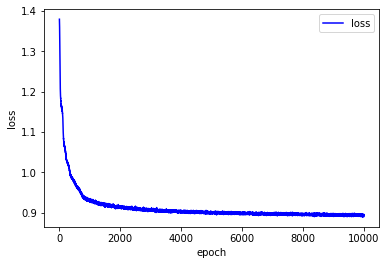

In [18]:
plt.plot(np.array(losses), c = 'blue', label = 'loss')
plt.legend(loc = 'upper right')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [19]:
# 저차원으로 임베딩 벡터 클러스터링 후 시각화 (GCN)

res_norm = scaler.fit_transform(result)

kmc = KMeans(n_clusters = 10)
kmc.fit(res_norm)
predict = pd.Series(kmc.predict(res_norm))
df_stop1['class'] = predict

# plotly 시각화: 색깔은 클래스별 부여, 점의 크기가 클수록 큰 점수를 받은 정류장을 의미함
df_stop1['x'] = res_norm[:,0]
df_stop1['y'] = res_norm[:,1]
df_stop1['z'] = res_norm[:,2]
df_stop1['score'] = 1 - df_scores['result']
df_stop1['score_int'] = len(df_scores) - df_scores['rank']
df_stop1['class'] = df_stop1['class'].apply(str)

df = px.data.iris()
fig = px.scatter_3d(df_stop1, x='x', y='y', z='z', size= 'score_int', size_max=18,
              color='class',color_discrete_sequence=px.colors.qualitative.T10)

fig.update_layout(margin=dict(l=10, r=10, b=10, t=10))
fig.show()

In [20]:
# 저차원으로 임베딩 벡터 클러스터링 후 시각화 (DWGNN)

res_norm = scaler.fit_transform(result2)

kmc = KMeans(n_clusters = 10)
kmc.fit(res_norm)
predict = pd.Series(kmc.predict(res_norm))
df_stop1['class'] = predict

# plotly 시각화: 색깔은 클래스별 부여, 점의 크기가 클수록 큰 점수를 받은 정류장을 의미함
df_stop1['x'] = res_norm[:,0]
df_stop1['y'] = res_norm[:,1]
df_stop1['z'] = res_norm[:,2]
df_stop1['score'] = 1 - df_scores['result']
df_stop1['score_int'] = len(df_scores) - df_scores['rank']
df_stop1['class'] = df_stop1['class'].apply(str)

df = px.data.iris()
fig = px.scatter_3d(df_stop1, x='x', y='y', z='z', size= 'score_int', size_max=18,
              color='class',color_discrete_sequence=px.colors.qualitative.T10)

fig.update_layout(margin=dict(l=20, r=20, b=20, t=20))
fig.show()

In [ ]:
# 임베딩 벡터 간 cosine similarity를 구해 비슷한 정류장 찾기

from numpy import dot
from numpy.linalg import norm
import numpy as np
def cos_sim(A, B):
       return dot(A, B)/(norm(A)*norm(B))
    
def find_most_similar_node(Z, src_node_id, df_stop):
    src_idx = df_stop.loc[df_stop['정류장ID'] == src_node_id].index.item()
    src_z = Z[src_idx]
    best_sim = -99
    best_idx = -1
    for idx in range(len(Z)):
        if idx == src_idx:
            continue
        cur_z = Z[idx]
        cur_sim = cos_sim(src_z, cur_z)
        if cur_sim > best_sim:
            best_sim = cur_sim
            best_idx = idx
            
    return best_sim, df_stop.iloc[best_idx]

df_similar_table = pd.DataFrame(columns = ['target_stop', 'similar_stop', 'similarity'])
for i, r in tqdm(df_stop1.iterrows()):
    target_stop = r
    similarity, similar_stop = find_most_similar_node(result, target_stop['정류장ID'], df_stop1)
    df_similar_table = df_similar_table.append({'target_stop' : target_stop['정류장명'], 'similar_stop': similar_stop['정류장명'], 'similarity' : similarity}, ignore_index = True)

In [ ]:
df_similar_table